### Import packages

In [1]:
import numpy as np
import anndata as ad
import pandas as pd
import scanpy as sc
import scipy
import os
import seaborn as sns
import matplotlib as mpl
from matplotlib import rcParams
import matplotlib.pyplot as plt
import gc
from scipy.stats import pearsonr
import os
import scanpy as sc
import muon as mu
from scipy.sparse import issparse, csr_matrix
from typing import Optional
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm

from matplotlib.colors import ListedColormap
from matplotlib.ticker import MaxNLocator
from scipy.cluster.hierarchy import linkage, leaves_list
from scipy.sparse import issparse
from scipy.spatial import distance_matrix
import warnings

warnings.filterwarnings("ignore")

gc.enable()

/home/in68/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/in68/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/in68/miniconda3/envs/cell2loc_env/lib/python3.9/site-pac

In [18]:
from utility_scripts import *
from ploting_scripts import *

In [3]:
sc.settings.verbosity = 3  
# verbosity: errors (0), warnings (1), info (2), hints (3)
# sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80, facecolor='white', frameon=True, figsize=(5, 5),vector_friendly=True, dpi_save=300)
# Font properties for the scale bar
fontprops = fm.FontProperties(size=7)
# Set global figure parameters for scanpy
sc.settings.set_figure_params(fontsize=7)

In [4]:
gc.collect()

58774

### colorpallete:

In [5]:
# Inferno colormap with light grey for zero/ND value
inferno = mpl.colormaps['inferno'].resampled(256)
newcolors = inferno(np.linspace(0, 1, 256))
light_grey = np.array([240/256, 240/256, 240/256, 1])
newcolors[:1, :] = light_grey
newcmp4 = ListedColormap(newcolors)

# Plasma colormap with light grey for zero/ND value
plasma = mpl.colormaps['plasma'].resampled(256)
newcolors = plasma(np.linspace(0, 1, 256))
light_grey = np.array([240/256, 240/256, 240/256, 1])
newcolors[:1, :] = light_grey
newcmp3 = ListedColormap(newcolors)

# Viridis colormap with light grey for zero/ND value
vir = mpl.colormaps['viridis'].resampled(256)
newcolors = vir(np.linspace(0, 1, 256))
light_grey = np.array([240/256, 240/256, 240/256, 1])
newcolors[:1, :] = light_grey
newcmp5 = ListedColormap(newcolors)

# Jet colormap with light grey for zero/ND value
jet = mpl.colormaps['jet'].resampled(256)
newcolors = jet(np.linspace(0, 1, 256))
light_grey = np.array([240/256, 240/256, 240/256, 1])
newcolors[:1, :] = light_grey
newcmp6 = ListedColormap(newcolors)

# Reds colormap with light grey for zero/ND value
reds = mpl.colormaps['Reds'].resampled(256)
newcolors = reds(np.linspace(0, 1, 256))
light_grey = np.array([240/256, 240/256, 240/256, 1])
newcolors[:1, :] = light_grey
newcmp7 = ListedColormap(newcolors)

# Coolwarm colormap with light grey for zero/ND value
cwrm = mpl.colormaps['coolwarm'].resampled(256)
newcolors = cwrm(np.linspace(0, 1, 256))
light_grey = np.array([240/256, 240/256, 240/256, 1])
newcolors[:1, :] = light_grey
newcmp8 = ListedColormap(newcolors)


## Databases: 

In [6]:
#Load and process the gene annotation file to use metadata for analysis e.g. Biotype % calculations
# Read the .tsv file
gtf_info = pd.read_csv("Annotation_files/GRCm39_GENCODEM32_ReoT1L_gene_info_gtf.tsv", sep="\t")
gtf_info = gtf_info.drop_duplicates(subset=['GENEID'], keep='first')

# Remove period/decimal suffixes from ensembl IDs
gtf_info['GeneID'] = gtf_info['GENEID'].str.split('.').str[0]

# Extract chromosome value before the colon
gtf_info['chr'] = gtf_info['Chromosome'].str.split(':').str[0]

# Add '.1' to the Reovirus gene names to match the gtf file...
gtf_info["GENEID"] = [f"{GENE}.1" if 'T1LReovirus' in GENE else GENE for GENE in gtf_info['GENEID']]

print(f"Using {len(gtf_info['GENEID'].unique())} ensembl IDs, from {gtf_info['GeneSymbol'].nunique()} genes, and {gtf_info['Biotype'].nunique()} biotypes...\n")

# Display the first few rows
print(gtf_info.head())



#Add NCBI taxonomic ID file as dataframe to build taxonomic-level specific adata objects 
taxid = pd.read_csv('Annotation_files/ncbi_lineages_2024-01-19.csv')
Taxonomic_df = taxid.copy()
def add_prefix(x):
    return f'taxid_{x}'

# Applying function to 'tax_id' column
Taxonomic_df['tax_id'] = Taxonomic_df['tax_id'].apply(add_prefix)

# Display the updated DataFrame
print(Taxonomic_df.head())

Using 56973 ensembl IDs, from 56825 genes, and 38 biotypes...

                 GENEID     GeneSymbol            Chromosome  \
0  ENSMUSG00000102693.2  4933401J01Rik  chr1:3143476-3144545   
1  ENSMUSG00000064842.3        Gm26206  chr1:3172239-3172348   
2  ENSMUSG00000051951.6           Xkr4  chr1:3276124-3741721   
3  ENSMUSG00000102851.2        Gm18956  chr1:3322980-3323459   
4  ENSMUSG00000103377.2        Gm37180  chr1:3435954-3438772   

                Biotype Strand              GeneID   chr  
0                   TEC      +  ENSMUSG00000102693  chr1  
1                 snRNA      +  ENSMUSG00000064842  chr1  
2        protein_coding      -  ENSMUSG00000051951  chr1  
3  processed_pseudogene      +  ENSMUSG00000102851  chr1  
4                   TEC      -  ENSMUSG00000103377  chr1  
    tax_id superkingdom          phylum                class  \
0  taxid_1          NaN             NaN                  NaN   
1  taxid_2     Bacteria             NaN                  NaN   
2  tax

## Load Mudata Objects

In [7]:
load_dir = "/workdir/in68/microSTRS/saved_mudata"
mudata_dict = {}

for sample in os.listdir(load_dir):
    sample_path = os.path.join(load_dir, sample)
    modalities = {}
    for fname in os.listdir(sample_path):
        if fname.endswith(".h5ad"):
            mod_name = fname.replace(".h5ad", "")
            modalities[mod_name] = sc.read_h5ad(os.path.join(sample_path, fname))
    mudata_dict[sample] = mu.MuData(modalities)


## Figures 

### Microbial Enrichment barplots

In [8]:
def extract_microbe_host_ratios(mudata_dict, experiment_dict, modality, classified=True):
    data = []
    for experiment, samples in experiment_dict.items():
        for sample in samples:
            if modality in mudata_dict[sample].mod:
                mask_micro = mudata_dict[sample].mod[modality].obsm['classification']['C']
                micro = mudata_dict[sample][modality][mask_micro].obs
                total_micro = micro['Total_counts_classified' if classified else 'Total_counts'].sum()

                mask_host = mudata_dict[sample].mod['host'].obsm['classification']['C']
                host_total = mudata_dict[sample].mod['host'][mask_host].obs['Total_molecules_detected'].sum()

                ratio = total_micro / host_total if host_total else 0
            else:
                ratio = 0
            data.append({
                'Experiment': experiment,
                'Sample': sample,
                'Type': 'STRS' if 'STRS' in sample else 'Visium',
                'Ratio': ratio
            })
    return pd.DataFrame(data)


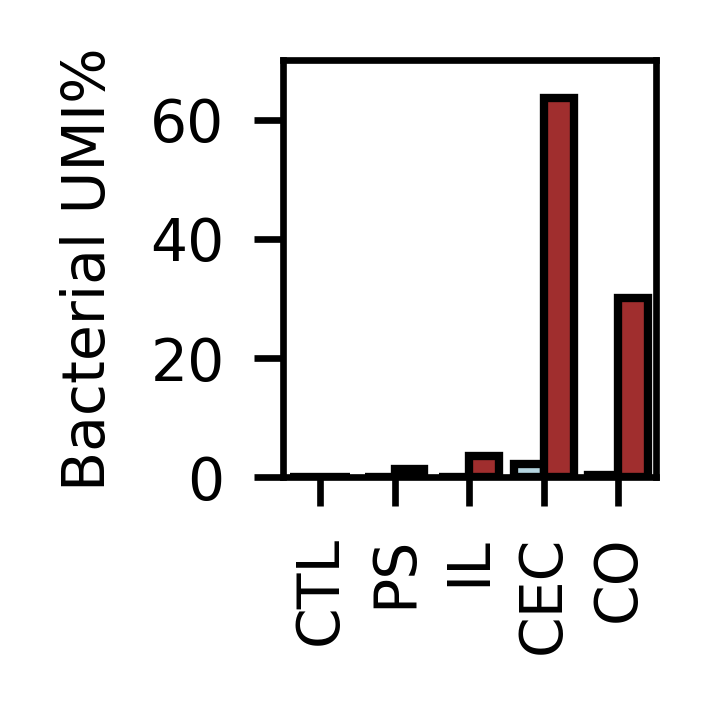

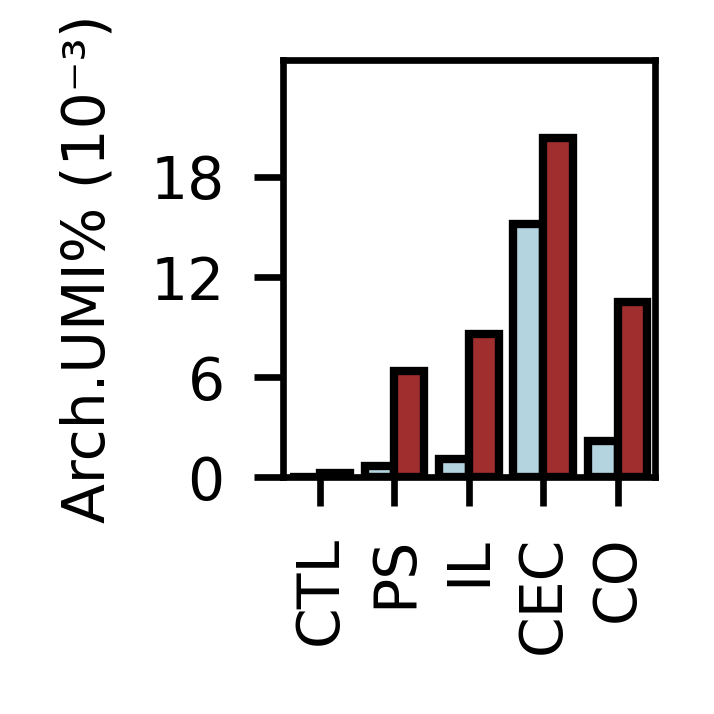

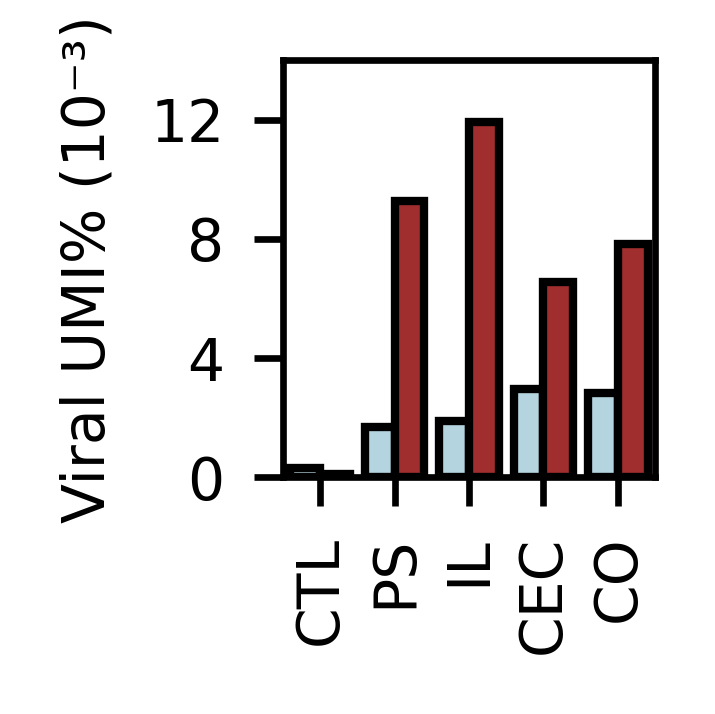

In [9]:
# Define experiment dictionary and colors
Experiment_dict = {
    "CTL": ["Visium_heart", "STRS_heart"], 
    "PS": ["Visium_A", "STRS_A"],
    "IL": ["Visium_B", "STRS_B"], 
    "CEC": ["Visium_D", "STRS_D"],
    "CO": ["Visium_C", "STRS_C"]
}
colors = ['#ADD8E6', '#B31B1B']  # Light blue for Visium, Carnelian red for STRS

# Extract ratios
ratios_bacteria = extract_microbe_host_ratios(mudata_dict, Experiment_dict, "family", classified=True)
ratios_archaea = extract_microbe_host_ratios(mudata_dict, Experiment_dict, "family_archaea", classified=False)
ratios_virus = extract_microbe_host_ratios(mudata_dict, Experiment_dict, "family_virus", classified=True)

# Scale ratios
ratios_bacteria["Ratio"] *= 100
ratios_archaea["Ratio"] *= 10e5
ratios_virus["Ratio"] *= 10e5

# # Plot 1: Bacteria
plt.figure(figsize=(1.2, 1.2), dpi=300)
sns.barplot(x='Experiment', y='Ratio', hue='Type', data=ratios_bacteria,
            palette=colors, hue_order=['Visium', 'STRS'], edgecolor='black')
plt.ylabel('Bacterial UMI%', fontsize=7)
plt.xticks(rotation=90, fontsize=7)
plt.yticks([0, 20, 40, 60], fontsize=7)
plt.ylim(0, 70)
plt.xlabel('')
plt.grid(False)
plt.title('')
plt.legend().set_visible(False)
plt.tight_layout()
plt.show()

# Plot 2: Archaea
plt.figure(figsize=(1.2, 1.2), dpi=300)
sns.barplot(x='Experiment', y='Ratio', hue='Type', data=ratios_archaea,
            palette=colors, hue_order=['Visium', 'STRS'], edgecolor='black')
plt.ylabel('Arch.UMI% (10⁻³)', fontsize=7)
plt.xticks(rotation=90, fontsize=7)
plt.yticks([0, 6, 12, 18], fontsize=7)
plt.ylim(0, 25)
plt.xlabel('')
plt.grid(False)
plt.title('')
plt.legend().set_visible(False)
plt.tight_layout()
plt.show()

# Plot 3: Viruses
plt.figure(figsize=(1.2, 1.2), dpi=300)
sns.barplot(x='Experiment', y='Ratio', hue='Type', data=ratios_virus,
            palette=colors, hue_order=['Visium', 'STRS'], edgecolor='black')
plt.ylabel('Viral UMI% (10⁻³)', fontsize=7)
plt.xticks(rotation=90, fontsize=7)
plt.yticks([0, 4, 8, 12], fontsize=7)
plt.ylim(0, 14)
plt.xlabel('')
plt.grid(False)
plt.title('')
plt.legend().set_visible(False)
plt.tight_layout()
plt.show()


### Pseudobulk comparisons

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


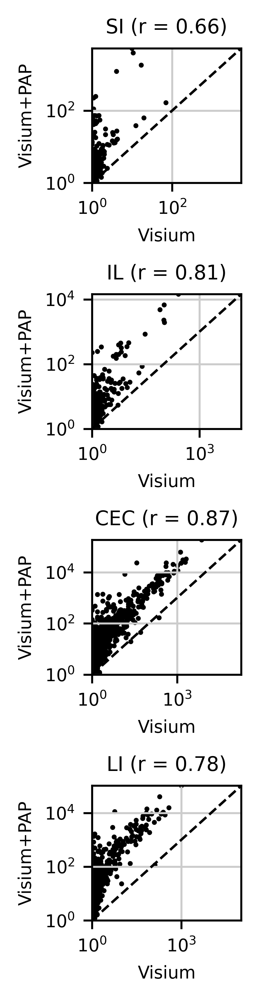

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


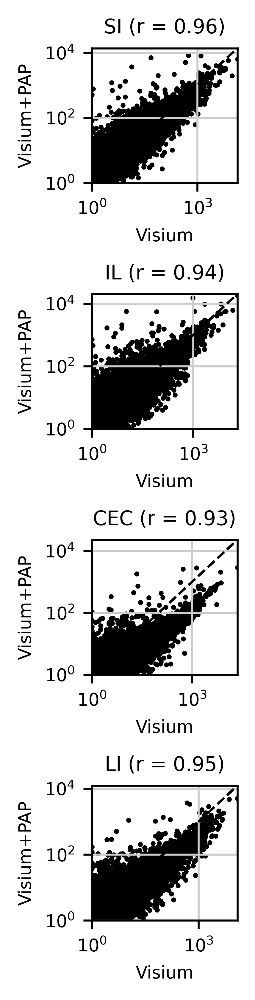

In [19]:
# Set experiment dictionary
Experiment_dict = {
    "SI": ["Visium_A", "STRS_A"],
    "IL": ["Visium_B", "STRS_B"],
    "CEC": ["Visium_D", "STRS_D"],
    "LI": ["Visium_C", "STRS_C"],
}

# Plot for genus
pseudobulk_comparisons(mudata_dict, Experiment_dict, 'genus')

# Plot for host
pseudobulk_comparisons(mudata_dict, Experiment_dict, 'host')


In [20]:
# With continuous distance coloring
plot_host_vs_microbe_scatter(mudata_dict['STRS_D'], 'STRS_D', log=False, color_by_distance=True)

# With categorical Lumen vs Tissue coloring
plot_host_vs_microbe_scatter(mudata_dict['STRS_D'], 'STRS_D', log=False, color_by_distance=False)

# With continuous distance coloring
plot_host_vs_microbe_scatter(mudata_dict['STRS_C'], 'STRS_D', log=False, color_by_distance=True)

# With categorical Lumen vs Tissue coloring
plot_host_vs_microbe_scatter(mudata_dict['STRS_D'], 'STRS_D', log=False, color_by_distance=False)


TypeError: plot_host_vs_microbe_scatter() got an unexpected keyword argument 'color_by_distance'

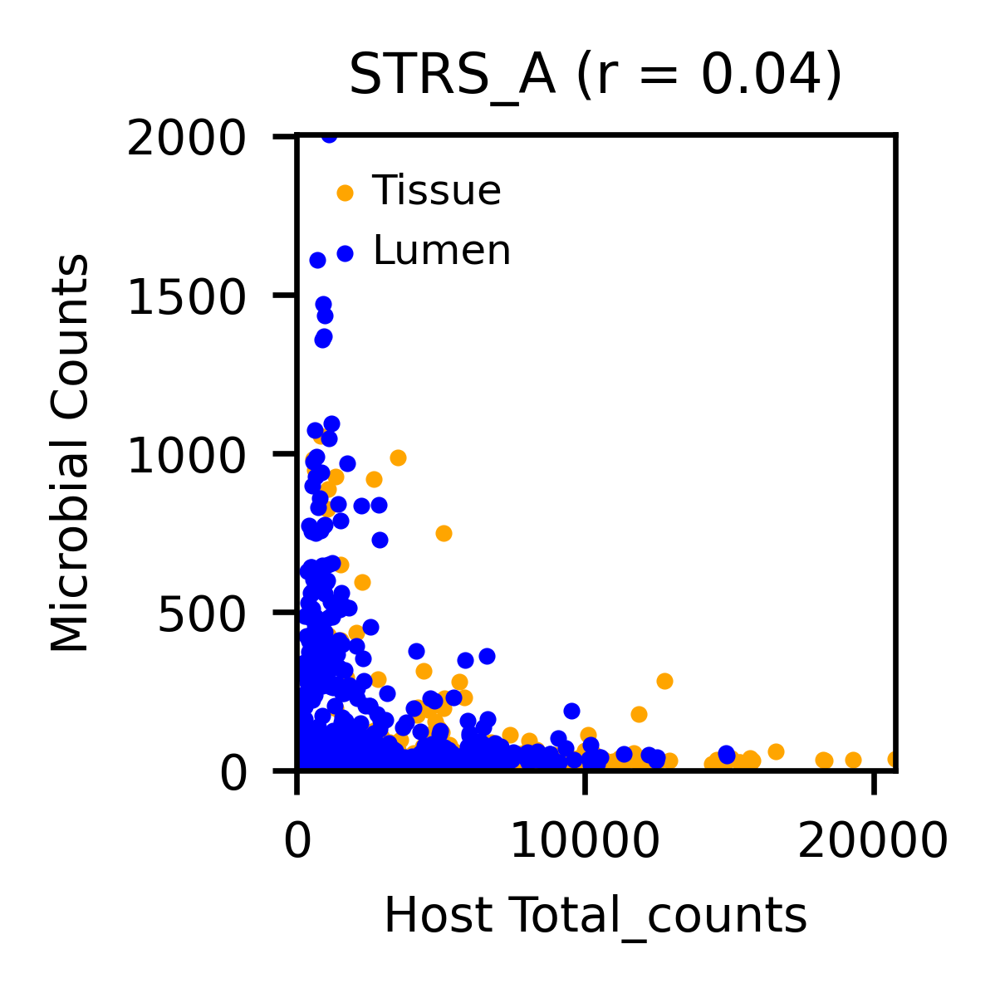

In [22]:
# With continuous distance coloring
plot_host_vs_microbe_scatter(mudata_dict['STRS_A'], 'STRS_A', log=False)

# # With categorical Lumen vs Tissue coloring
# plot_host_vs_microbe_scatter(mudata_dict['STRS_B'], 'STRS_B', log=False, color_by_distance=True)

# # With continuous distance coloring
# plot_host_vs_microbe_scatter(mudata_dict['STRS_C'], 'STRS_C', log=False, color_by_distance=True)

# # With categorical Lumen vs Tissue coloring
# plot_host_vs_microbe_scatter(mudata_dict['STRS_D'], 'STRS_D', log=False, color_by_distance=True)


# # With continuous distance coloring
# plot_host_vs_microbe_scatter(mudata_dict['Visium_A'], 'Visium_A', log=False, color_by_distance=True)

# # With categorical Lumen vs Tissue coloring
# plot_host_vs_microbe_scatter(mudata_dict['Visium_B'], 'Visium_B', log=False, color_by_distance=True)

# # With continuous distance coloring
# plot_host_vs_microbe_scatter(mudata_dict['Visium_C'], 'Visium_C', log=False, color_by_distance=True)

# # With categorical Lumen vs Tissue coloring
# plot_host_vs_microbe_scatter(mudata_dict['Visium_D'], 'Visium_D', log=False, color_by_distance=True)

In [17]:
import inspect
print(inspect.getsource(plot_host_vs_microbe_scatter))

def plot_host_vs_microbe_scatter(mdata, sample_name, log=False):
    host = mdata['host']
    bacteria = mdata['family'] if 'family' in mdata.mod else None

    if bacteria is None:
        print(f"No bacterial modality for {sample_name}")
        return

    # Align indices and fill with zeros
    total_counts = host.obs['Total_counts'].reindex(host.obs_names).fillna(0)
    total_molecules = host.obs['Total_molecules_detected'].reindex(host.obs_names).fillna(0)
    microbial_counts = bacteria.obs['Total_counts_classified'].reindex(host.obs_names).fillna(0)

    # Classification masks
    is_B = host.obsm['classification']['B']
    is_C_not_B = host.obsm['classification']['C'] & ~is_B

    # Pearson r (exclude nan/inf values)
    valid = (~np.isnan(total_counts)) & (~np.isnan(microbial_counts)) & \
            (~np.isinf(total_counts)) & (~np.isinf(microbial_counts))
    r, _ = pearsonr(total_counts[valid], microbial_counts[valid])

    # Axis scaling
    x = total_counts
    y = micro

###  Biotype boxplots


In [12]:
## Functions to extract and filter and make my life easier for now 
def extract_feature_data(mudata_dict, experiment_dict, feature):
    data_list = []

    for experiment, samples in experiment_dict.items():
        for sample in samples:
            mudata = mudata_dict[sample]  # Retrieve MuData object
            sample_type = 'STRS' if 'STRS' in sample else 'Visium'

            # Extract the feature from 'host' modality
            feature_data = mudata.mod['host'].obs[feature]
            
            # Create a DataFrame with the feature data
            combined_df = pd.DataFrame({
                feature: feature_data
            })
            
            # Add experiment and type information
            combined_df['Experiment'] = experiment
            combined_df['Type'] = sample_type
            combined_df['Sample'] = sample

            data_list.append(combined_df)

    combined_df = pd.concat(data_list, axis=0)
    return combined_df

def filter_feature_data(combined_df, mudata_dict, feature):
    filtered_data_list = []

    for sample in combined_df['Sample'].unique():
        mudata = mudata_dict[sample]
        host_obs = mudata.mod['host'].obs

        # Get classification filters (must be same index as host.obs)
        classification_B = mudata.mod['host'].obsm['classification']['B']
        classification_C = mudata.mod['host'].obsm['classification']['C']
        filter_condition = (~classification_B) & (classification_C)

        # Get the subset of combined_df corresponding to this sample
        sample_df = combined_df[combined_df['Sample'] == sample].copy()

        # Align the sample_df to the index of host.obs (which is also index of filter_condition)
        # This assumes combined_df uses the same index as mudata.mod['host'].obs
        aligned_df = sample_df.loc[filter_condition.index.intersection(sample_df.index)]

        # Now apply the filter condition
        filtered_data = aligned_df.loc[filter_condition.loc[aligned_df.index]]
        filtered_data_list.append(filtered_data)

    filtered_combined_df = pd.concat(filtered_data_list, axis=0).reset_index(drop=True)
    return filtered_combined_df

def calculate_statistics(filtered_combined_df, feature):
    # Calculate statistics for each sample
    sample_stats = filtered_combined_df.groupby(['Experiment', 'Type', 'Sample'])[feature].agg(['mean', 'median', 'std']).reset_index()
    
    # Calculate statistics across Type (excluding Control)
    group_stats = filtered_combined_df[filtered_combined_df['Experiment'] != "CTL"].groupby('Type')[feature].agg(['mean', 'median']).reset_index()
    
    return sample_stats, group_stats


In [26]:
# Define the colors
colors = ['#ADD8E6', '#B31B1B']  # Light blue for Visium, Carnelian red for STRS

## Calculate total rRNA as the sum of rRNA + Mt.rRNA
for mudata in mudata_dict.keys():
    mudata_dict[mudata]['host'].obs['Total_rRNA_pct'] = mudata_dict[mudata]['host'].obs['pct.Mt_rRNA'] + mudata_dict[mudata]['host'].obs['pct.rRNA']


# Experiment_dict is assumed to be defined as below:
Experiment_dict = {
    # "CTL": ["Visium_heart", "STRS_heart"],    
    "SI": ["Visium_A", "STRS_A"],
    "IL": ["Visium_B", "STRS_B"],
    "CEC": ["Visium_D", "STRS_D"],
    "LI": ["Visium_C", "STRS_C"]
}

# List of features to plot
features = ['Unspliced.pct', 'pct.protein_coding', 'pct.rRNA', 'pct.lncRNA', 'pct.miRNA', 'pct.snRNA', 'pct.snoRNA', 'pct.Mt_tRNA', 'pct.misc_RNA', 'pct.Mt_rRNA','pct.ribozyme','Total_rRNA_pct']

# List of alternative titles
alternative_titles = {
    'Unspliced.pct': 'Unsp/Spl',
    'pct.protein_coding': 'Protein (%)',
    'pct.rRNA': 'rRNA (%)',
    'pct.lncRNA': 'lncRNA (%)',
    'pct.miRNA': 'miRNA (%)',
    'pct.snRNA': 'snRNA (%)',
    'pct.snoRNA': 'snoRNA (%)',
    'pct.Mt_tRNA': 'Mt tRNA (%)',
    'pct.misc_RNA': 'Misc RNA (%)',
    'pct.Mt_rRNA': 'Mt rRNA (%)',
    'pct.ribozyme': 'Ribozyme (%)',
    'Total_rRNA_pct' :   'rRNA* (%)'
}

Sample Statistics for Unspliced.pct:
   Experiment    Type    Sample      mean    median       std
0        CEC    STRS    STRS_D  0.160441  0.159585  0.099825
1        CEC  Visium  Visium_D  0.021703  0.019638  0.009565
2         IL    STRS    STRS_B  0.166324  0.164448  0.042671
3         IL  Visium  Visium_B  0.020415  0.019922  0.004932
4         LI    STRS    STRS_C  0.113282  0.103868  0.043280
5         LI  Visium  Visium_C  0.020049  0.018540  0.011343
6         SI    STRS    STRS_A  0.167631  0.159261  0.052045
7         SI  Visium  Visium_A  0.022884  0.021898  0.005478
Group Statistics (excluding Control) for Unspliced.pct:
      Type      mean    median
0    STRS  0.156077  0.151786
1  Visium  0.021456  0.020461
Sample Statistics for pct.protein_coding:
   Experiment    Type    Sample       mean     median       std
0        CEC    STRS    STRS_D  88.473770  89.442810  6.446816
1        CEC  Visium  Visium_D  95.795403  95.946449  1.315151
2         IL    STRS    STRS_B  91

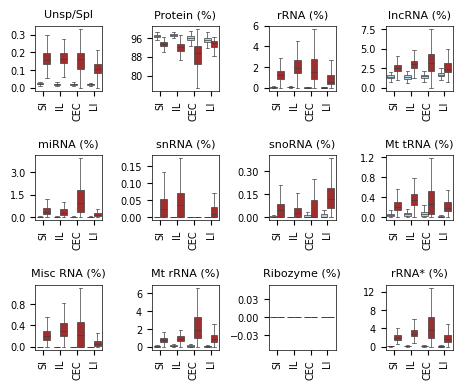

In [ ]:
num_features = len(features)
nrows = 3
ncols = 4

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 1.2, nrows * 1.2))

for idx, feature in enumerate(features):
    row = idx // ncols
    col = idx % ncols
    
    # Step 1: Extract data
    combined_df = extract_feature_data(mudata_dict, Experiment_dict, feature)
    
    # Step 2: Filter data
    filtered_combined_df = filter_feature_data(combined_df, mudata_dict, feature)

    # Debug: Check if the filtered combined DataFrame is empty
    if filtered_combined_df.empty:
        print(f"The filtered combined DataFrame for {feature} is empty after filtering. Please check the filter conditions.")
    else:
        # # Step 3: Calculate statistics
        # sample_stats_df, group_stats_df = calculate_statistics(filtered_combined_df, feature)
        
        # # Debug: Print the statistics DataFrame to check if statistics are calculated correctly
        # print(f"Sample Statistics for {feature}:\n", sample_stats_df)
        # print(f"Group Statistics (excluding Control) for {feature}:\n", group_stats_df)
        
        # Step 4: Create the box plot for the feature
        sns.boxplot(ax=axes[row, col], x='Experiment', y=feature, hue='Type', data=filtered_combined_df, 
                    palette=colors, showfliers=False, linewidth=0.5)
        
        # Adjust the thickness of the axes lines
        axes[row, col].spines['top'].set_linewidth(0.5)
        axes[row, col].spines['right'].set_linewidth(0.5)
        axes[row, col].spines['left'].set_linewidth(0.5)
        axes[row, col].spines['bottom'].set_linewidth(0.5)
        
        # Set y-axis ticks
        axes[row, col].yaxis.set_major_locator(MaxNLocator(nbins=4))
        
        # Rotate the x-axis labels to vertical
        axes[row, col].tick_params(axis='x', rotation=90, labelsize=7)
        axes[row, col].tick_params(axis='y', labelsize=7)
        
        # Set the title to the alternative title for the feature
        axes[row, col].set_title(alternative_titles[feature], fontsize=8)
        
        # Remove x labels and set common y-axis label for UMIs
        axes[row, col].set_xlabel('')
        axes[row, col].set_ylabel('')

        # Remove the legend
        axes[row, col].legend().set_visible(False)
        axes[row, col].set_axisbelow(True)

# Adjust layout to avoid overlap
plt.tight_layout()
plt.subplots_adjust(left=0.08, right=0.95, top=0.95, bottom=0.05)

# Save the entire figure with all subplots
# plt.savefig("combined_boxplots_new.pdf", dpi=300)
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


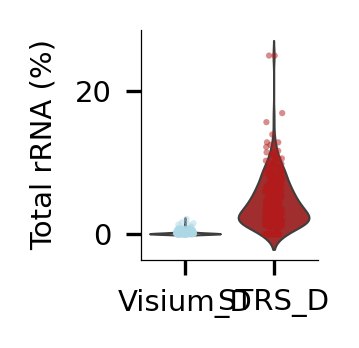

In [34]:
# Subset data
samples_cec = ['Visium_D', 'STRS_D']
data_list = []

for sample in samples_cec:
    adata = mudata_dict[sample]['host']
    classification_C = adata.obsm['classification']['C']
    classification_B = adata.obsm['classification']['B']
    filter_condition = (~classification_B) & (classification_C)
    
    df = pd.DataFrame({
        'Sample': sample,
        'Total_rRNA_pct': adata.obs.loc[filter_condition, 'Total_rRNA_pct']
    })
    data_list.append(df)

# Combine into one DataFrame
rRNA_df = pd.concat(data_list)
rRNA_df = rRNA_df.reset_index(drop=True)


# Set color palette manually based on sample
sample_palette = {
    'Visium_D': '#ADD8E6',
    'STRS_D': '#B31B1B'
}

# Plot: violin + strip
plt.figure(figsize=(1.2, 1.2), dpi=300)
sns.violinplot(data=rRNA_df, x='Sample', y='Total_rRNA_pct',
               palette=sample_palette, inner=None, linewidth=0.5)
sns.stripplot(data=rRNA_df, x='Sample', y='Total_rRNA_pct',
              palette=sample_palette, jitter=True, size=1.5, alpha=0.5)

# Style
plt.ylabel('Total rRNA (%)', fontsize=7)
plt.xlabel('')
plt.xticks(fontsize=7)
plt.yticks(fontsize=7)
plt.grid(False)
plt.legend().set_visible(False)
sns.despine()
plt.tight_layout()
plt.show()


In [36]:
rRNA_df['Sample'].value_counts()

Sample
STRS_D      374
Visium_D    273
Name: count, dtype: int64

### Combined Host: location specific non coding expression and microbe: relative abundance and unique taxa 

#### Longitudinal changes on the family level

normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
              mean        std
Sample                       
STRS_A    8.239882   6.715733
STRS_B   14.665138   8.782984
STRS_C   95.624260  39.988783
STRS_D  112.109898  34.544039


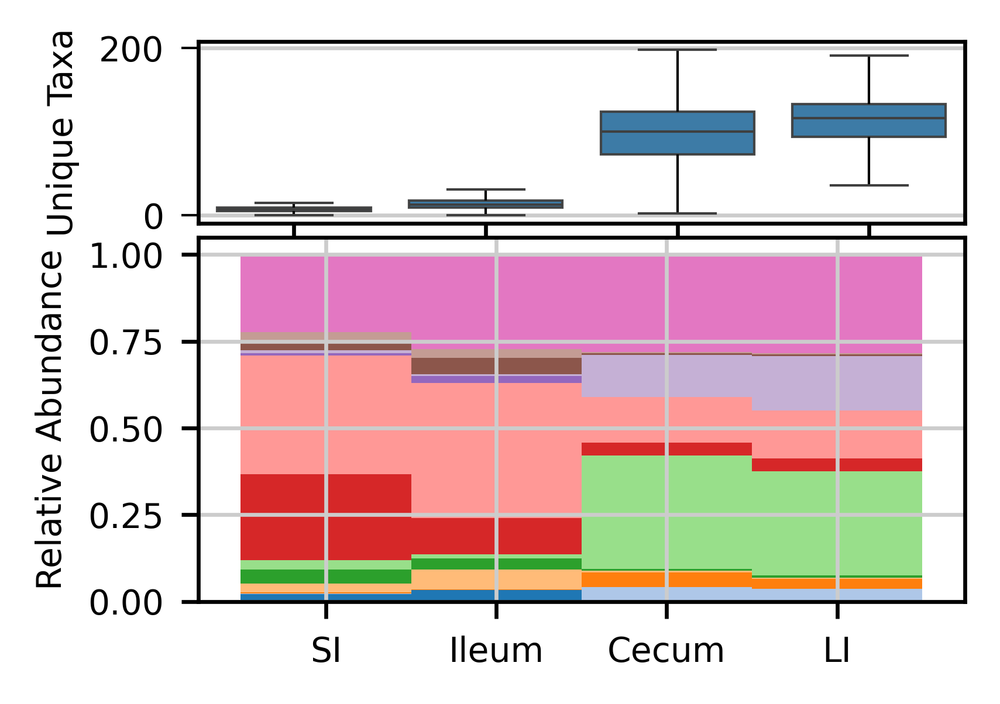

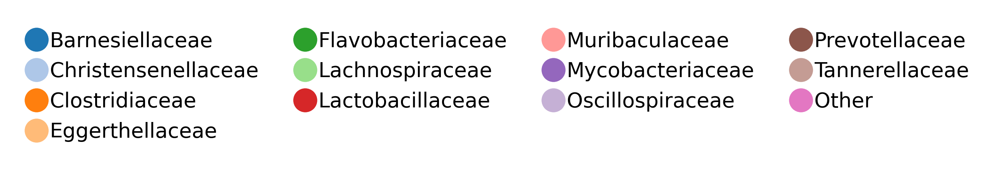

In [13]:
import scanpy as sc
from anndata import AnnData
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.sparse import issparse
import anndata

# Set global parameters to ensure text is editable and consistent font usage
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['figure.dpi'] = 300


# Prepare and filter data
def prepare_data(key, label):
    adata = mudata_dict[key]['family'].copy()  # Create a copy to avoid view modifications
    classification = adata.obsm['classification']['B']
    adata_filtered = adata[classification, :].copy()  # Create a copy to avoid view modifications
    adata_filtered.obs['location'] = label
    return adata_filtered

# Prepare data for each group
adata_A = prepare_data('STRS_A', 'SI')
adata_B = prepare_data('STRS_B', 'Ileum')
adata_C = prepare_data('STRS_C', 'LI')
adata_D = prepare_data('STRS_D', 'Cecum')

# Calculate top 10 most abundant genes for each dataset
top_genes_A = high_exp_list(adata_A, n_top=10)
top_genes_B = high_exp_list(adata_B, n_top=10)
top_genes_C = high_exp_list(adata_C, n_top=10)
top_genes_D = high_exp_list(adata_D, n_top=10)

# Get the union of these genes
genes_to_plot = list(set(top_genes_A) | set(top_genes_B) | set(top_genes_C) | set(top_genes_D))

# Concatenate the AnnData objects
combined_adata = anndata.concat([adata_A, adata_B, adata_C, adata_D])



# Calculate relative abundances for the combined data
proportions = calculate_relative_abundances(combined_adata, genes_to_plot)

# Ensure locations are ordered as 'SI', 'Ileum', 'Cecum', 'LI'
proportions = proportions.reindex(['SI', 'Ileum', 'Cecum', 'LI'])

# Extract unique taxa per spot
samples = ['STRS_A', 'STRS_B', 'STRS_C', 'STRS_D']
unique_taxa_data = get_unique_taxa_data(mudata_dict, samples)

# Prepare data for box plot
boxplot_data = pd.DataFrame({
    'Unique_taxa': np.concatenate([unique_taxa_data[sample] for sample in samples]),
    'Sample': np.concatenate([[sample] * len(unique_taxa_data[sample]) for sample in samples])
})
# Calculate the mean for each Sample position
stats_unique_taxa_per_sample = boxplot_data.groupby('Sample')['Unique_taxa'].agg(['mean', 'std'])
# To view the result
print(stats_unique_taxa_per_sample)

# Set the size of the figure and create subplots
fig = plt.figure(figsize=(2.8, 2.1))

# Define the gridspec
gs = fig.add_gridspec(2, 1, height_ratios=[1, 2], hspace=0.05)

# Box plot subplot
ax0 = fig.add_subplot(gs[0])
sns.boxplot(
    data=boxplot_data, 
    x='Sample', 
    y='Unique_taxa', 
    ax=ax0, 
    showfliers=False, 
    showcaps=True,
    boxprops=dict(alpha=0.95, linewidth=0.5),
    whiskerprops=dict(linewidth=0.5, color='black'),
    medianprops=dict(linewidth=0.5), 
    capprops=dict(linewidth=0.5))

ax0.set_ylabel('Unique Taxa', fontsize=7)
ax0.set_xlabel('')
ax0.tick_params(axis='both', which='major', labelsize=7)
ax0.set_xticklabels([])
ax0.yaxis.set_tick_params(width=0.5)

# Relative abundance plot subplot
ax1 = fig.add_subplot(gs[1])
num_colors = len(proportions.columns)  # Including 'Other'
cmap = plt.get_cmap('tab20')
colors = cmap.colors[:num_colors]
proportions.plot(kind='bar', stacked=True, ax=ax1, color=colors, width=1, edgecolor='none')
ax1.set_xlabel('', fontsize=7)  # No x-axis title
ax1.set_ylabel('Relative Abundance', fontsize=7)
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.get_legend().remove()  # Remove the legend
ax1.set_xticklabels([])  # Remove x-axis labels but keep ticks

# Align x-ticks
for ax in [ax0, ax1]:
    ax.set_xticks(range(len(proportions.index)))
    ax.set_xticklabels(proportions.index, rotation=0)

# Save the main plot
plt.tight_layout()
plt.savefig("combined_plot_without_legend_genus.pdf", transparent=True)
plt.show()

# Create a separate legend figure
fig_legend = plt.figure(figsize=(3.5, 0.5))
ax2 = fig_legend.add_subplot(111)
ax2.axis('off')

# Create legend elements
legend_labels = proportions.columns.tolist()
legend_colors = colors[:len(legend_labels)]
legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label=f"{label}", 
                              markersize=8, markerfacecolor=color, markeredgewidth=0.5) 
                   for label, color in zip(legend_labels, legend_colors)]

# Add custom legend
ax2.legend(handles=legend_elements, loc='center', ncol=4, frameon=False)

# Save the legend plot
plt.tight_layout()
plt.savefig("legend_plot_genus.pdf", transparent=True)
plt.show()


### Host specific expression 

### Binned relative abundances

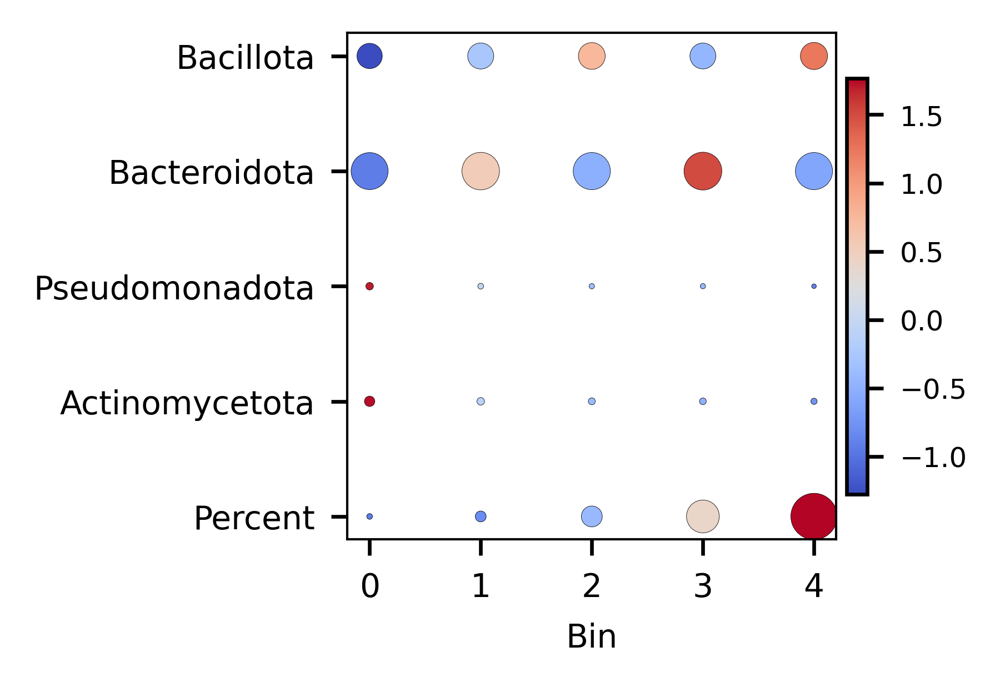

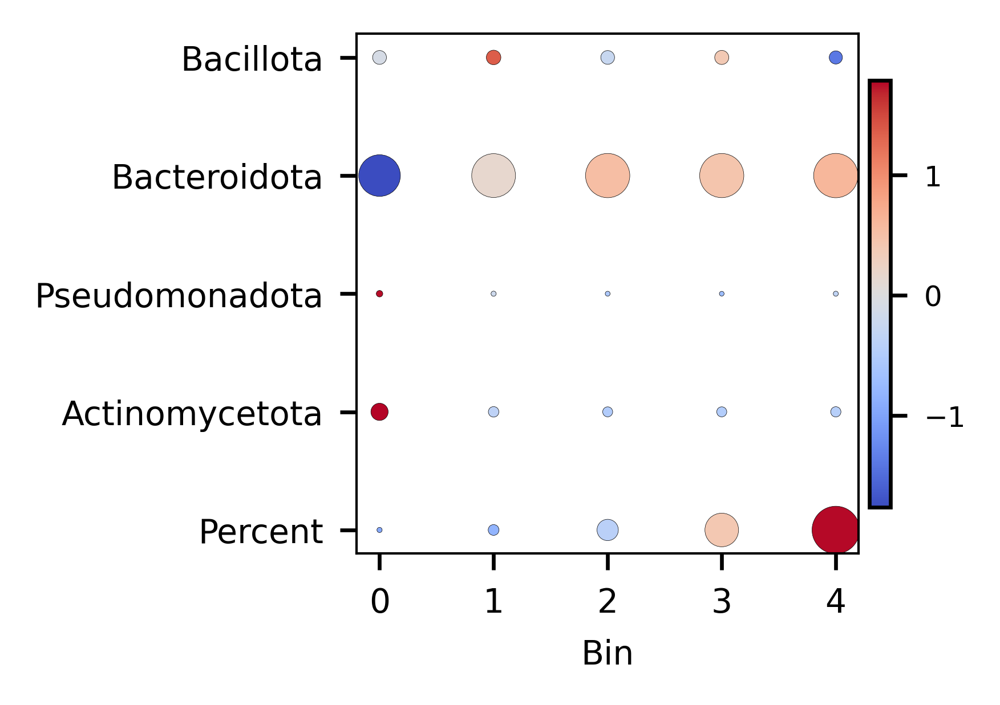

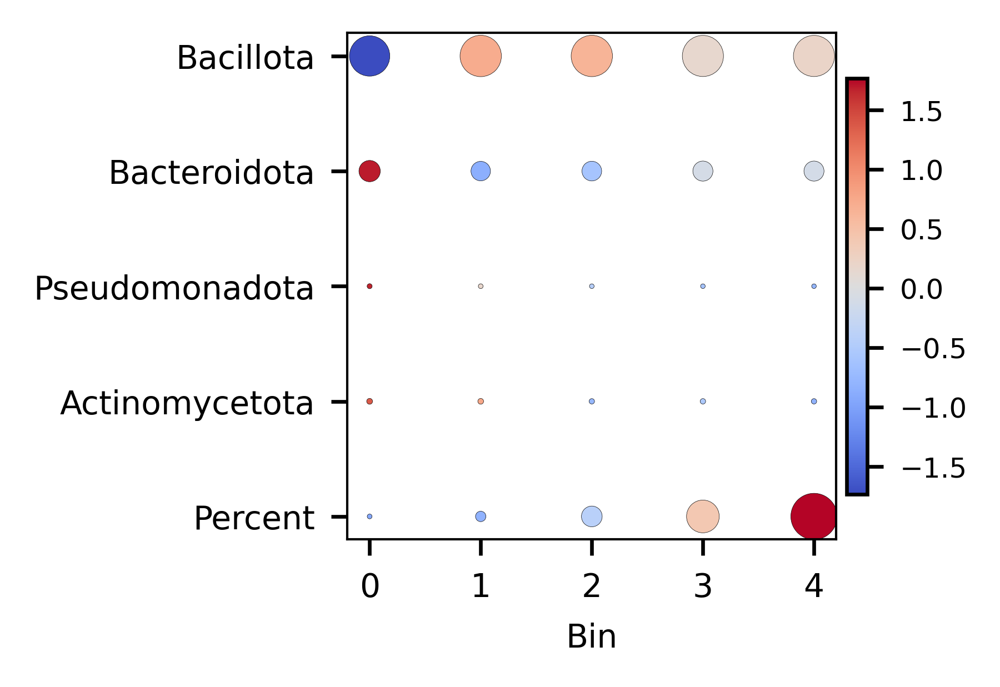

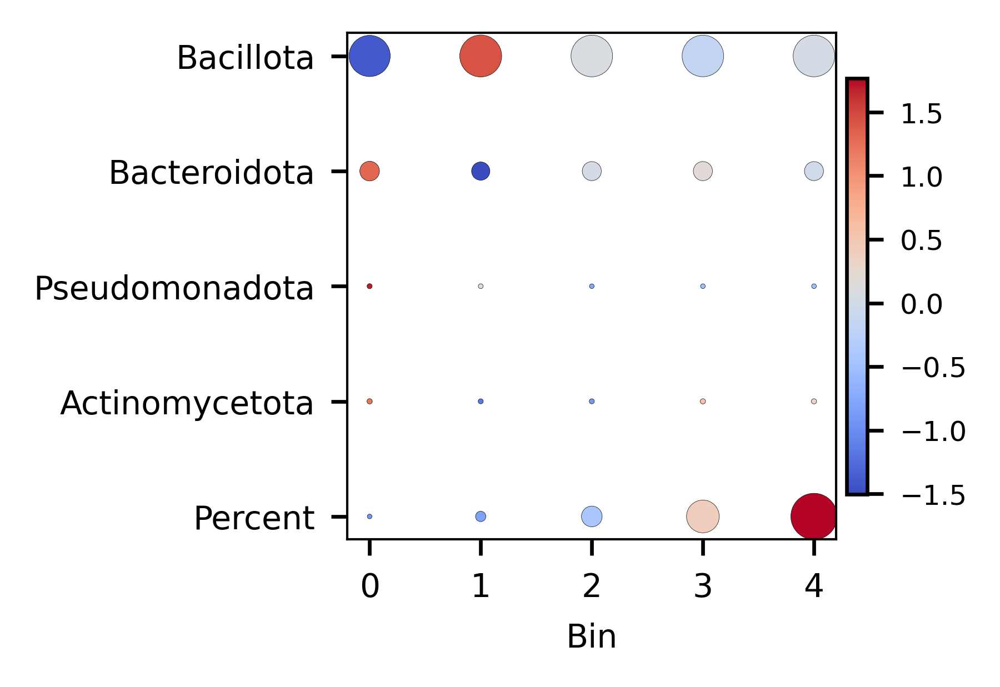

In [23]:
# import matplotlib as mpl
# import matplotlib.pyplot as plt
# import seaborn as sns
# import pandas as pd
# import numpy as np
# from scipy.cluster.hierarchy import linkage, leaves_list
# from scipy.sparse import issparse
# from scipy.spatial import distance_matrix
# import scanpy as sc

# # Set global plotting parameters for high-quality vector graphics
# mpl.rcParams['pdf.fonttype'] = 42
# mpl.rcParams['figure.dpi'] = 300


# def calculate_distances_and_bins(mudata_dict, sample, modality, num_bins):
#     """
#     Assigns each spatial spot to a bin based on its distance to the lumen (C but not B spots are distance=0).
#     """
#     adata = mudata_dict[sample][modality]
#     classification_B = adata.obsm['classification']['B']
#     classification_C = adata.obsm['classification']['C']

#     coords = adata.obsm['spatial']
#     B_coords = coords[classification_B]
#     C_not_B_coords = coords[classification_C & ~classification_B]

#     if len(B_coords) > 0 and len(C_not_B_coords) > 0:
#         dist_matrix = distance_matrix(B_coords, C_not_B_coords)
#         min_distances = dist_matrix.min(axis=1)

#         B_barcodes = adata.obs.index[classification_B]
#         distance_B_df = pd.DataFrame(min_distances, index=B_barcodes, columns=['min_distance'])

#         C_not_B_barcodes = adata.obs.index[classification_C & ~classification_B]
#         distance_C_not_B_df = pd.DataFrame(0, index=C_not_B_barcodes, columns=['min_distance'])

#         distance_df = pd.concat([distance_B_df, distance_C_not_B_df])
#         distance_df['min_distance'] = np.clip(distance_df['min_distance'], a_min=0, a_max=None)

#         distance_df['bin'] = pd.cut(distance_df['min_distance'], bins=num_bins-1, labels=range(1, num_bins))
#         distance_df['bin'] = distance_df['bin'].astype('category').cat.set_categories(range(num_bins))
#         distance_df.loc[C_not_B_barcodes, 'bin'] = 0

#         adata.obs['bin'] = distance_df['bin']
#         return adata
#     else:
#         return adata


# def dot_plot_normalized_zscore(adata, genes, sample_name, num_bins=5, min_counts=1, output_file=None):
#     """
#     Generate a dot plot showing percent and z-scored relative abundance of taxa or genes across spatial bins.
#     Includes a 'Percent' gene to visually indicate the dot size scale.
#     """
#     adata = adata[adata.obsm['classification']['C']].copy()
#     distance_df = adata.obs['bin']

#     if distance_df.empty:
#         print("No valid distances calculated.")
#         return

#     X = adata.raw.X
#     var_names = adata.var.index
#     gene_indices = [var_names.get_loc(g) for g in genes if g in var_names]
#     if len(gene_indices) != len(genes):
#         print("Missing genes:", set(genes) - set(var_names))

#     cell_indices = adata.obs.index.isin(distance_df.index)

#     if issparse(X):
#         expression_data = pd.DataFrame(X[cell_indices, :][:, gene_indices].toarray(), index=adata.obs[cell_indices].index, columns=genes)
#     else:
#         expression_data = pd.DataFrame(X[cell_indices, :][:, gene_indices], index=adata.obs[cell_indices].index, columns=genes)

#     gene_sums = expression_data.sum(axis=0)
#     filtered_genes = gene_sums[gene_sums >= min_counts].index.tolist()
#     if not filtered_genes:
#         print("No genes meet threshold.")
#         return

#     expression_data = expression_data[filtered_genes]
#     distance_df = distance_df.cat.codes.fillna(num_bins - 1).astype(int)
#     expression_data['bin'] = distance_df
#     aggregated_expression = expression_data.groupby('bin').sum().reindex(range(num_bins), fill_value=0)

#     bin_counts = aggregated_expression.sum(axis=1)
#     percent_counts = (aggregated_expression.T / bin_counts).T * 100
#     z_scores = (percent_counts - percent_counts.mean()) / percent_counts.std()

#     # Add a dummy "Percent" feature to visually encode dot size scale
#     legend_gene = 'Percent'
#     proportions = [1, 5, 20, 50, 100]
#     for i in range(num_bins):
#         percent_counts.loc[i, legend_gene] = proportions[i]
#         z_scores.loc[i, legend_gene] = (proportions[i] - np.mean(proportions)) / np.std(proportions)

#     clustered_genes = filtered_genes + [legend_gene]
#     data = [{'Gene': g, 'Bin': b, 'Z-score': z_scores.loc[b, g], 'Percent': percent_counts.loc[b, g]} for g in clustered_genes for b in range(num_bins)]
#     df = pd.DataFrame(data)

#     # Plot
#     fig_height = 0.4 * len(clustered_genes)
#     fig, ax = plt.subplots(figsize=(2, fig_height))
#     fig.patch.set_facecolor('none')
#     ax.set_facecolor('none')

#     scatter = sns.scatterplot(
#         data=df,
#         x='Bin',
#         y='Gene',
#         size='Percent',
#         hue='Z-score',
#         palette='coolwarm',
#         edgecolor='k',
#         ax=ax,
#         sizes=(1,100),
#         legend=False
#     )

#     # Set x-ticks explicitly to bin labels
#     ax.set_xticks(range(num_bins))
#     ax.set_xticklabels([str(i) for i in range(num_bins)], fontsize=7)
#     ax.set_yticklabels(ax.get_yticklabels(), fontsize=7)
#     plt.grid(False)
#     plt.xlabel('Bin')
#     plt.ylabel('')

#     # Add border box
#     for spine in ax.spines.values():
#         spine.set_visible(True)
#         spine.set_color('black')
#         spine.set_linewidth(0.5)

#     # Add colorbar
#     norm = plt.Normalize(df['Z-score'].min(), df['Z-score'].max())
#     sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
#     sm.set_array([])
#     cbar = fig.colorbar(sm, ax=ax, fraction=0.04, pad=0.02)
#     cbar.ax.tick_params(labelsize=6)

#     if output_file:
#         plt.savefig(output_file, format='pdf', dpi=300, transparent=True)
#     plt.show()

samples = ['STRS_A','STRS_B','STRS_C','STRS_D']
num_bins = 5
modality = 'phylum'
for sample in samples:
    adata = mudata_dict[sample][modality]
    adata = calculate_distances_and_bins(mudata_dict, sample, modality, num_bins)
    genes = ["Bacillota", "Bacteroidota", "Pseudomonadota","Actinomycetota"]
    
    # output_file = f"{sample}_dot_plot.pdf"
    dot_plot_normalized_zscore(adata, genes, sample_name=sample, num_bins=5, min_counts=2)    


## Feature plots space

/home/in68/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1208: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/in68/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1208: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/in68/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1208: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/in68/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1208: FutureWarning:

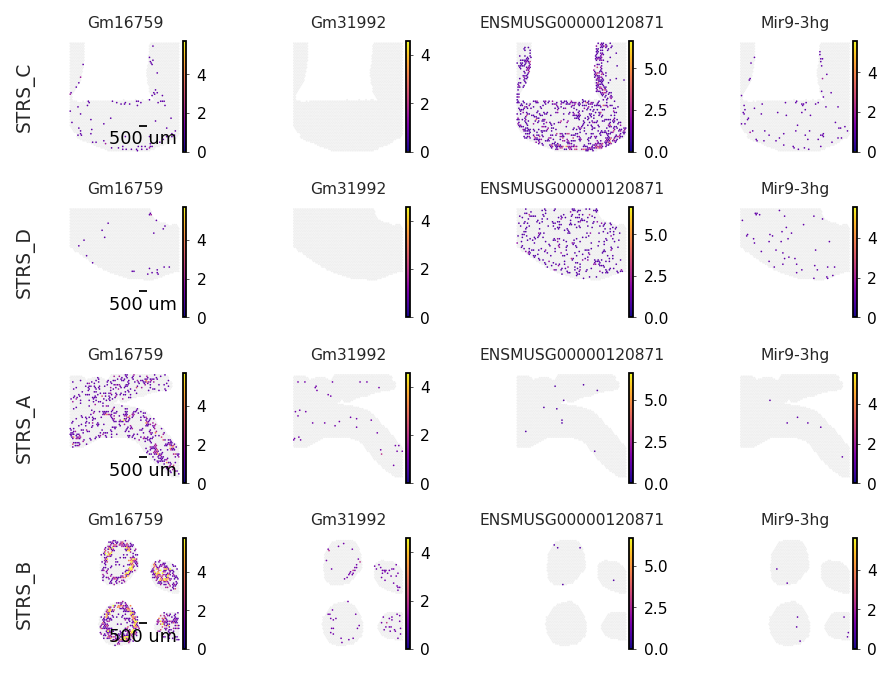

In [604]:
import matplotlib.pyplot as plt
import scanpy as sc
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
import numpy as np

# Font properties for scale bar
fontprops = fm.FontProperties(size=8)

# Assuming 'mudata_dict' contains your MuData objects for different samples
samples_to_plot = [ 'STRS_C','STRS_D','STRS_A','STRS_B']
modality_to_plot = 'host'
genes_to_plot = ["Gm16759", "Gm31992", "ENSMUSG00000120871", "Mir9-3hg"]

# Calculate global extents to ensure all plots have the same spatial limits
global_min_x, global_max_x, global_min_y, global_max_y = float('inf'), float('-inf'), float('inf'), float('-inf')
global_vmax = {gene: float('-inf') for gene in genes_to_plot}
global_vmin = {gene: float('inf') for gene in genes_to_plot}

# Determine the global min/max for each gene
for sample in samples_to_plot:
    adata = mudata_dict[sample][modality_to_plot]
    for gene in genes_to_plot:
        global_vmin[gene] = min(global_vmin[gene], adata[:, gene].X.min())
        global_vmax[gene] = max(global_vmax[gene], adata[:, gene].X.max())
        
    coords = adata.obsm['spatial']
    global_min_x, global_max_x = min(global_min_x, coords[:, 0].min()), max(global_max_x, coords[:, 0].max())
    global_min_y, global_max_y = min(global_min_y, coords[:, 1].min()), max(global_max_y, coords[:, 1].max())

# Optional padding
padding = 50
global_min_x -= padding
global_max_x += padding
global_min_y -= padding
global_max_y += padding

# Setup figure and axes
fig, axs = plt.subplots(len(samples_to_plot), len(genes_to_plot), figsize=(7, 5), squeeze=False)

# Plot each gene for each sample with standardized spatial dimensions
for i, sample_key in enumerate(samples_to_plot):
    adata = mudata_dict[sample_key][modality_to_plot].copy()
    classification_B = adata.obsm['classification']['B']
    classification_C = adata.obsm['classification']['C']
    mask = classification_C & ~ classification_B
    adata = adata[adata.obsm['classification']['C']]
    
    for j, gene in enumerate(genes_to_plot):
        ax = axs[i, j]
        sc.pl.spatial(adata, color=gene, ax=ax, show=False,
                      vmin=global_vmin[gene],
                      vmax=global_vmax[gene],  # Use global vmax for consistency
                      cmap=newcmp3, spot_size=100, frameon=False,
                      title=gene if i == 0 else None)  # Title only for top row

        # Set consistent axes limits
        ax.set_xlim(global_min_x, global_max_x)
        ax.set_ylim(global_min_y, global_max_y)
        ax.set_aspect('equal', adjustable='box')

        # Adding a scale bar to the first plot of each row
        if j == 0:
            scalebar = AnchoredSizeBar(ax.transData, 500, '500 um', 'lower right',
                                       pad=0.1, color='black', frameon=False, size_vertical=1,
                                       fontproperties=fontprops)
            ax.add_artist(scalebar)

        # Remove any legend to clean up the plot
        if ax.get_legend() is not None:
            ax.get_legend().remove()
    
    # Add vertical sample names to the first column
    axs[i, 0].annotate(sample_key, xy=(0, 0.5), xytext=(-axs[i, 0].yaxis.labelpad - 5, 0),
                       xycoords=axs[i, 0].yaxis.label, textcoords='offset points',
                       size='large', ha='center', va='center', rotation=90)

# Adjust subplot spacing and display the figure
plt.subplots_adjust(wspace=0.1, hspace=0.5)  # Tighten layout to use space effectively
plt.savefig('Tissue_Specific_genes.pdf', format='pdf', dpi=300)

plt.show()


/home/in68/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1208: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/in68/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1208: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
findfont: Font family [] not found. Falling back to Helvetica.


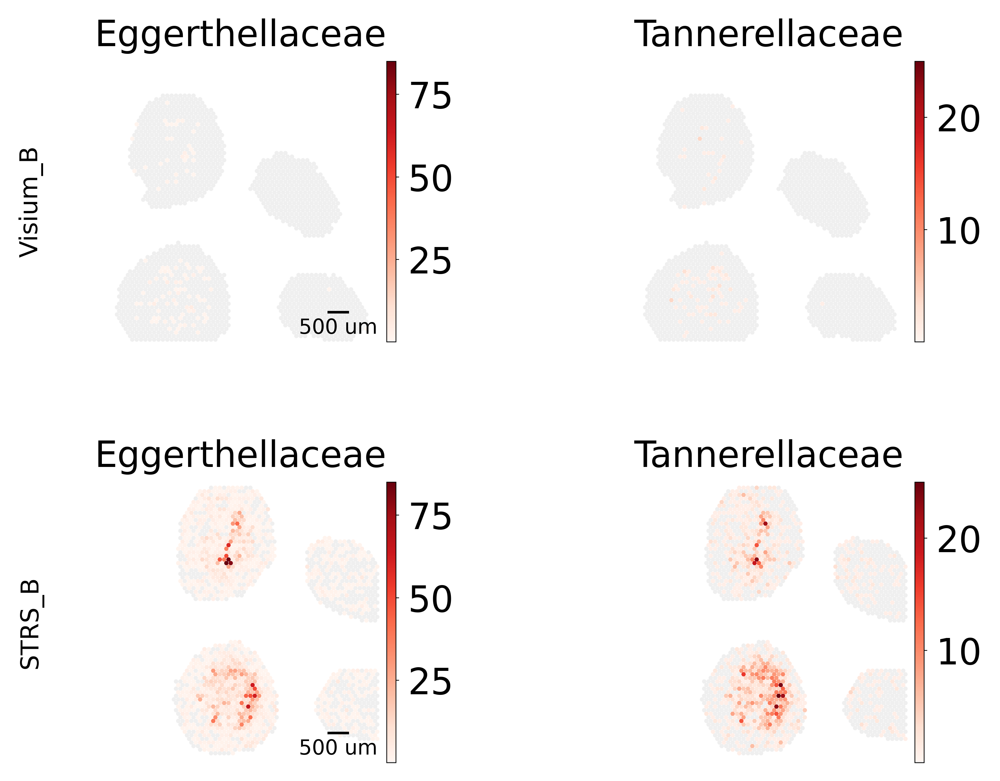

In [271]:
import matplotlib.pyplot as plt
import scanpy as sc
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
import numpy as np

# Font properties for scale bar
fontprops = fm.FontProperties(size=8)
# plt.rcParams['font.family'] = Helvetica 
# Assuming 'mudata_dict' contains your MuData objects for different samples
samples_to_plot = [ 'Visium_B','STRS_B']
modality_to_plot = 'family'
genes_to_plot = ["Eggerthellaceae","Tannerellaceae"]

# Calculate global extents to ensure all plots have the same spatial limits
global_min_x, global_max_x, global_min_y, global_max_y = float('inf'), float('-inf'), float('inf'), float('-inf')
global_vmax = {gene: float('-inf') for gene in genes_to_plot}
global_vmin = {gene: float('inf') for gene in genes_to_plot}
global_vmax['Eggerthellaceae'] = 85
global_vmax['Tannerellaceae'] = 25

# Determine the global min/max for each gene
for sample in samples_to_plot:
    adata = mudata_dict[sample][modality_to_plot]
    # for gene in genes_to_plot:
    #     global_vmin[gene] = min(global_vmin[gene], adata[:, gene].raw.X.min())
    #     global_vmax[gene] = max(global_vmax[gene], adata[:, gene].raw.X.max())
        
    coords = adata.obsm['spatial']
    global_min_x, global_max_x = min(global_min_x, coords[:, 0].min()), max(global_max_x, coords[:, 0].max())
    global_min_y, global_max_y = min(global_min_y, coords[:, 1].min()), max(global_max_y, coords[:, 1].max())

# Optional padding
padding = 50
global_min_x -= padding
global_max_x += padding
global_min_y -= padding
global_max_y += padding

# Setup figure and axes
fig, axs = plt.subplots(len(samples_to_plot), len(genes_to_plot), figsize=(7, 5), squeeze=False)

# Plot each gene for each sample with standardized spatial dimensions
for i, sample_key in enumerate(samples_to_plot):
    adata = mudata_dict[sample_key][modality_to_plot].copy()
    classification_B = adata.obsm['classification']['B']
    classification_C = adata.obsm['classification']['C']
    mask = classification_C & ~ classification_B
    adata = adata[adata.obsm['classification']['C']]
    # adata = adata[mask]
    
    for j, gene in enumerate(genes_to_plot):
        ax = axs[i, j]
        sc.pl.spatial(adata, color=gene, ax=ax, show=False,
                      vmin=0.01,
                      vmax=global_vmax[gene],  # Use global vmax for consistency
                      cmap=newcmp7, spot_size=100, frameon=False,
                      title=gene if i == 0 else None)  # Title only for top row

        # Set consistent axes limits
        ax.set_xlim(global_min_x, global_max_x)
        ax.set_ylim(global_min_y, global_max_y)
        ax.set_aspect('equal', adjustable='box')

        # Adding a scale bar to the first plot of each row
        if j == 0:
            scalebar = AnchoredSizeBar(ax.transData, 500, '500 um', 'lower right',
                                       pad=0.1, color='black', frameon=False, size_vertical=1,
                                       fontproperties=fontprops)
            ax.add_artist(scalebar)

        # Remove any legend to clean up the plot
        if ax.get_legend() is not None:
            ax.get_legend().remove()
    
    # Add vertical sample names to the first column
    axs[i, 0].annotate(sample_key, xy=(0, 0.5), xytext=(-axs[i, 0].yaxis.labelpad - 5, 0),
                       xycoords=axs[i, 0].yaxis.label, textcoords='offset points',
                       size='large', ha='center', va='center', rotation=90)

# Adjust subplot spacing and display the figure
plt.subplots_adjust(wspace=0.1, hspace=0.5)  # Tighten layout to use space effectively
plt.savefig('zoom_bacteria.pdf', format='pdf', dpi=300)

plt.show()


### Lets make the spatial plots now

In [62]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [ ]:
for samples in samples_to_plot:
    mudata_dict[samples]['host'].obs['logtotal_counts'] = log10(mudata_dict[samples]['host'].obs['Total_counts']+1)

In [573]:
import matplotlib.pyplot as plt
import scanpy as sc
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
import numpy as np

# Font properties for scale bar
fontprops = fm.FontProperties(size=5)
# plt.rcParams['font.family'] = Helvetica 
# Assuming 'mudata_dict' contains your MuData objects for different samples
samples_to_plot = [ 'Visium_A','Visium_B','Visium_C','Visium_D','STRS_A','STRS_B','STRS_C','STRS_D','STRS_E,''Visium_E']
modality_to_plot = 'host'
genes_to_plot = [#'Sox2ot','Scarna2','Rnu11','Hnf1aos1','2210408F21Rik','Rny3','Kcnq1ot1'

                        'Vaultrc5','Rn7sk','Lncppara','Mir145a','Mir143','Mir192'
                            

                                ]

# Calculate global extents to ensure all plots have the same spatial limits
global_min_x, global_max_x, global_min_y, global_max_y = float('inf'), float('-inf'), float('inf'), float('-inf')
global_vmax = {gene: float('-inf') for gene in genes_to_plot}
global_vmin = {gene: float('inf') for gene in genes_to_plot}
# global_vmax['Total_counts'] = 20000
# global_vmax['Unspliced.pct'] = 0.7
# global_vmax['pct.protein_coding'] = 100
# global_vmax['pct.lncRNA'] = 20
# global_vmax['pct.rRNA'] = 30
# global_vmax['pct.snoRNA'] = 10
# global_vmax['pct.snRNA'] = 10
# global_vmax['pct.misc_RNA'] = 10
# global_vmax['pct.Mt_tRNA'] = 10
# global_vmax['pct.Mt_rRNA'] = 30




# Determine the global min/max for each gene
for sample in samples_to_plot:
    adata = mudata_dict[sample][modality_to_plot]
    # for gene in genes_to_plot:
    #     global_vmin[gene] = min(global_vmin[gene], adata[:, gene].raw.X.min())
    #     global_vmax[gene] = max(global_vmax[gene], adata[:, gene].raw.X.max())
        
    coords = adata.obsm['spatial']
    global_min_x, global_max_x = min(global_min_x, coords[:, 0].min()), max(global_max_x, coords[:, 0].max())
    global_min_y, global_max_y = min(global_min_y, coords[:, 1].min()), max(global_max_y, coords[:, 1].max())

# Optional padding
padding = 50
global_min_x -= padding
global_max_x += padding
global_min_y -= padding
global_max_y += padding

# Setup figure and axes
fig, axs = plt.subplots(len(samples_to_plot), len(genes_to_plot), figsize=(10, 6), squeeze=False)

# Plot each gene for each sample with standardized spatial dimensions
for i, sample_key in enumerate(samples_to_plot):
    adata = mudata_dict[sample_key][modality_to_plot].copy()
    classification_B = adata.obsm['classification']['B']
    classification_C = adata.obsm['classification']['C']
    mask = classification_C & ~ classification_B
    adata = adata[adata.obsm['classification']['C']]
    # adata = adata[mask]
    if i== len(samples_to_plot) - 1 :
        cbarloc = 'bottom'
    else : 
        cbarloc = 'bottom'

    
    for j, gene in enumerate(genes_to_plot):
        ax = axs[i, j]
        sc.pl.spatial(adata, color=gene, ax=ax, show=False,
                      vmin=0.00001,
                      # vmax=global_vmax[gene],  # Use global vmax for consistency
                      cmap=newcmp5, spot_size=100, frameon=False,colorbar_loc= cbarloc,
                      title=None )  # Title only for top row
        if i!= 0 :
            ax.set_title("")
             

        # Set consistent axes limits
        ax.set_xlim(global_min_x, global_max_x)
        ax.set_ylim(global_min_y, global_max_y)
        ax.set_aspect('equal', adjustable='box')

        # Adding a scale bar to the first plot of each row
        if j == 0:
            scalebar = AnchoredSizeBar(ax.transData, 500, '500 um', 'lower right',
                                       pad=0.1, color='black', frameon=False, size_vertical=1,
                                       fontproperties=fontprops)
            ax.add_artist(scalebar)

        # Remove any legend to clean up the plot
        if ax.get_legend() is not None:
            ax.get_legend().remove()
    
    # # Add vertical sample names to the first column
    # axs[i, 0].annotate(sample_key, xy=(0, 0.5), xytext=(-axs[i, 0].yaxis.labelpad - 5, 0),
    #                    xycoords=axs[i, 0].yaxis.label, textcoords='offset points',
    #                    size='large', ha='center', va='center', rotation=90)

# Adjust subplot spacing and display the figure
plt.subplots_adjust(wspace=0.05, hspace=0.05)  # Tighten layout to use space effectively
# plt.savefig('spatial_biotype_plots.pdf', format='pdf', dpi=300)

plt.show()


KeyError: 'STRS_E,Visium_E'

In [74]:
for sample in samples_to_plot:
    ## Add a filter to exclude lowly occuring taxa before calculating Richness
    adata = mudata_dict[sample]['genus'].copy()
    adata.X = adata.raw.X
    adata = adata[adata.obsm['classification']['C']]
    taxa_counts = adata.X.sum(axis=0) / adata.obs['Total_counts'].sum()
    mask = taxa_counts > 0.0001
    adata = adata[:,mask]
    spots = adata.X > 0 
    adata.obs['Richness']=spots.sum(axis=1)
    mudata_dict[sample]['family'].obs['Richness_g'] = adata.obs['Richness']
    mudata_dict[sample]['family'].obs['log1p_total_counts']= np.log1p(mudata_dict[sample]['family'].obs['Total_counts'])
    mudata_dict[sample]['family'].obs['log1p_total_counts_host'] = np.log1p(mudata_dict[sample]['host'].obs['Total_counts'])
    


/tmp/ipykernel_728515/2513494082.py:10: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['Richness']=spots.sum(axis=1)
/tmp/ipykernel_728515/2513494082.py:10: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['Richness']=spots.sum(axis=1)
/tmp/ipykernel_728515/2513494082.py:10: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['Richness']=spots.sum(axis=1)
/tmp/ipykernel_728515/2513494082.py:10: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['Richness']=spots.sum(axis=1)
/tmp/ipykernel_728515/2513494082.py:10: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['Richness']=spots.sum(axis=1)


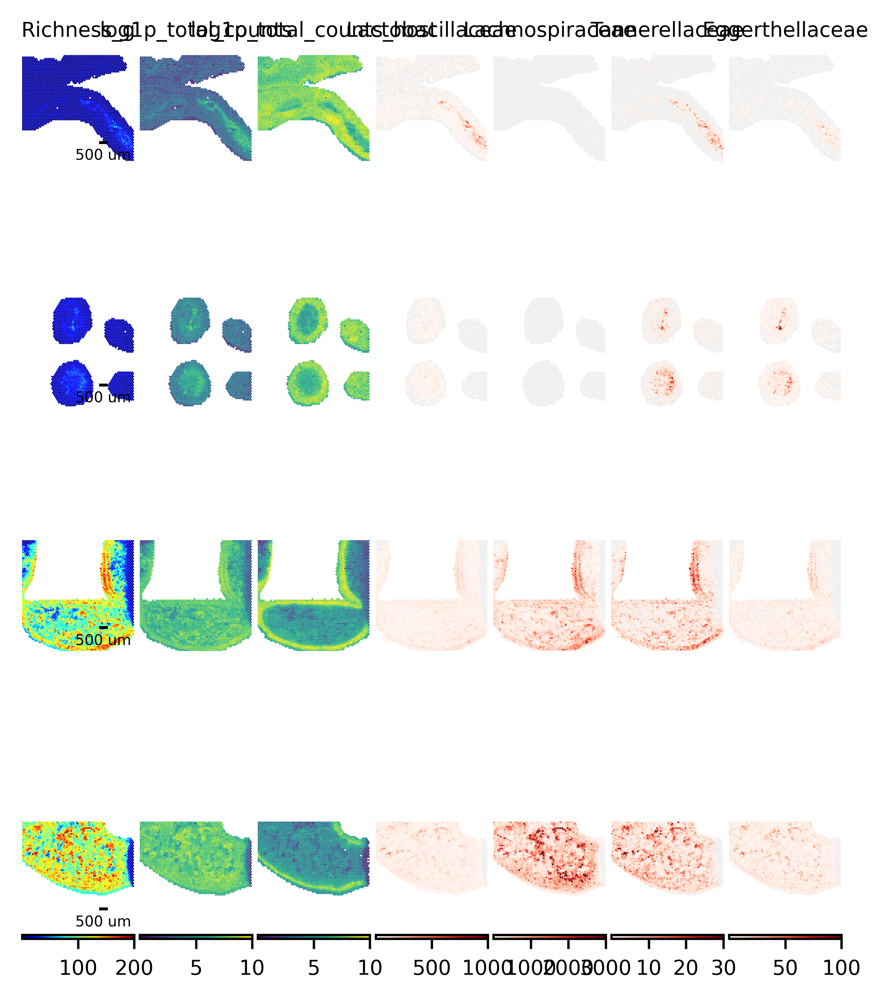

In [622]:
import scanpy as sc
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
import numpy as np

# Font properties for scale bar
fontprops = fm.FontProperties(size=5)
# plt.rcParams['font.family'] = Helvetica 
# Assuming 'mudata_dict' contains your MuData objects for different samples
samples_to_plot = [ 
    # 'Visium_A','Visium_B','Visium_C','Visium_D',
    'STRS_A','STRS_B','STRS_C','STRS_D']
modality_to_plot = 'family'
genes_to_plot = ['Richness_g','log1p_total_counts','log1p_total_counts_host',"Lactobacillaceae","Lachnospiraceae","Tannerellaceae","Eggerthellaceae"]
cmp = {}
# Calculate global extents to ensure all plots have the same spatial limits
global_min_x, global_max_x, global_min_y, global_max_y = float('inf'), float('-inf'), float('inf'), float('-inf')
global_vmax = {gene: float('-inf') for gene in genes_to_plot}
global_vmin = {gene: float('inf') for gene in genes_to_plot}
# global_vmax['Total_counts'] = 20000
global_vmax['log1p_total_counts'] =10 
global_vmax['Richness_g'] = 200
global_vmax['log1p_total_counts_host'] = 10
global_vmax['Lactobacillaceae'] = 1000
global_vmax['Lachnospiraceae'] = 3000
global_vmax['Tannerellaceae'] = 30
global_vmax['Eggerthellaceae'] = 100

### Define colormaps
cmp['log1p_total_counts'] =newcmp5 
cmp['Richness_g'] = newcmp6
cmp['log1p_total_counts_host'] = newcmp5
cmp['Lactobacillaceae'] = newcmp7
cmp['Lachnospiraceae'] = newcmp7
cmp['Tannerellaceae'] = newcmp7
cmp['Eggerthellaceae'] = newcmp7


# Determine the global min/max for each gene
for sample in samples_to_plot:
    adata = mudata_dict[sample][modality_to_plot]
    # for gene in genes_to_plot:
    #     global_vmin[gene] = min(global_vmin[gene], adata[:, gene].raw.X.min())
    #     global_vmax[gene] = max(global_vmax[gene], adata[:, gene].raw.X.max())
        
    coords = adata.obsm['spatial']
    global_min_x, global_max_x = min(global_min_x, coords[:, 0].min()), max(global_max_x, coords[:, 0].max())
    global_min_y, global_max_y = min(global_min_y, coords[:, 1].min()), max(global_max_y, coords[:, 1].max())

# Optional padding
padding = 5
global_min_x -= padding
global_max_x += padding
global_min_y -= padding
global_max_y += padding

# Setup figure and axes
fig, axs = plt.subplots(len(samples_to_plot), len(genes_to_plot), figsize=(5, 6), squeeze=False)

# Plot each gene for each sample with standardized spatial dimensions
for i, sample_key in enumerate(samples_to_plot):
    adata = mudata_dict[sample_key][modality_to_plot].copy()
    classification_B = adata.obsm['classification']['B']
    classification_C = adata.obsm['classification']['C']
    mask = classification_C & ~ classification_B
    adata = adata[adata.obsm['classification']['C']]
    # adata = adata[mask]
    if i== len(samples_to_plot) - 1 :
        cbarloc = 'bottom'
    else : 
        cbarloc = None

    
    for j, gene in enumerate(genes_to_plot):
        ax = axs[i, j]
        sc.pl.spatial(adata, color=gene, ax=ax, show=False,
                      vmin=0.00001,
                      vmax=global_vmax[gene],  # Use global vmax for consistency
                      cmap=cmp[gene], spot_size=100, frameon=False,colorbar_loc= cbarloc,
                      title=None, na_color= 'black' )  # Title only for top row
        if i!= 0 :
            ax.set_title("")
             

        # Set consistent axes limits
        ax.set_xlim(global_min_x, global_max_x)
        ax.set_ylim(global_min_y, global_max_y)
        ax.set_aspect('equal', adjustable='box')

        # Adding a scale bar to the first plot of each row
        if j == 0:
            scalebar = AnchoredSizeBar(ax.transData, 500, '500 um', 'lower right',
                                       pad=0.1, color='black', frameon=False, size_vertical=1,
                                       fontproperties=fontprops)
            ax.add_artist(scalebar)

        # Remove any legend to clean up the plot
        if ax.get_legend() is not None:
            ax.get_legend().remove()
    
    # # Add vertical sample names to the first column
    # axs[i, 0].annotate(sample_key, xy=(0, 0.5), xytext=(-axs[i, 0].yaxis.labelpad - 5, 0),
    #                    xycoords=axs[i, 0].yaxis.label, textcoords='offset points',
    #                    size='large', ha='center', va='center', rotation=90)

# Adjust subplot spacing and display the figure
plt.subplots_adjust(wspace=0.05, hspace=0.05)  # Tighten layout to use space effectively
plt.savefig('spatial_bacteria__supplement.pdf', format='pdf', dpi=300)

plt.show()


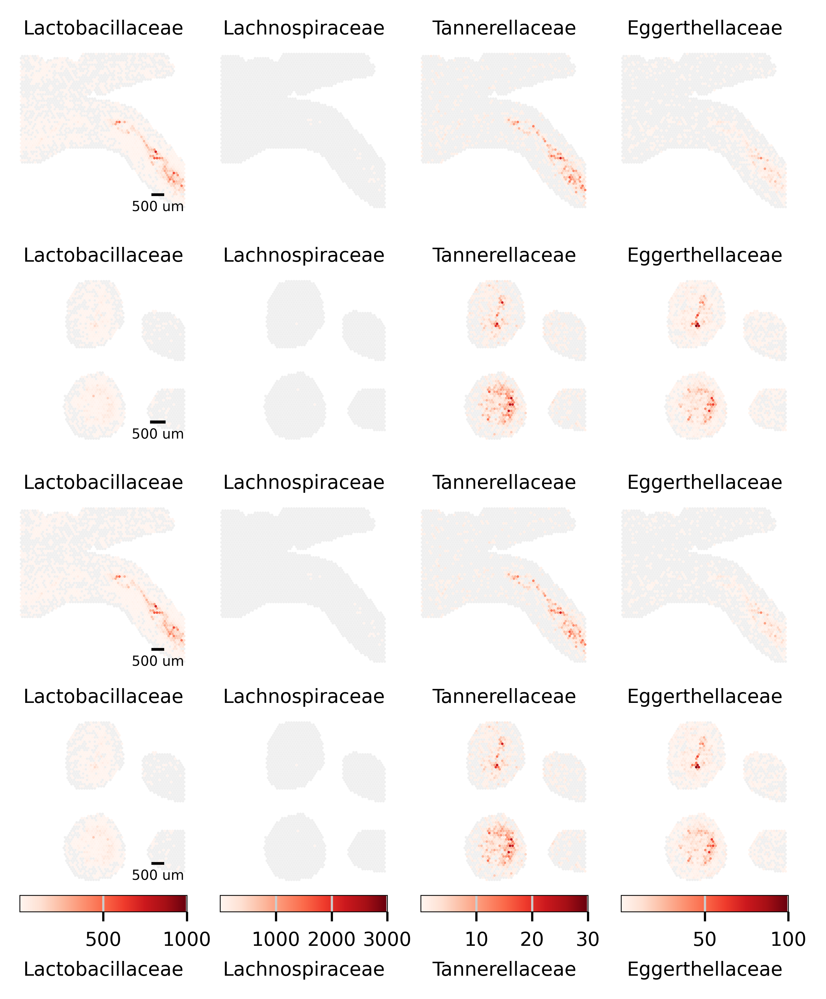

In [77]:
import scanpy as sc
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
import numpy as np
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import cm

# Font properties for scale bar
fontprops = fm.FontProperties(size=5)

# Assuming 'mudata_dict' contains your MuData objects for different samples
samples_to_plot = [
    'STRS_A', 'STRS_B','STRS_A', 'STRS_B', #'STRS_C', 'STRS_D'
]
modality_to_plot = 'family'
genes_to_plot = ["Lactobacillaceae", "Lachnospiraceae", "Tannerellaceae", "Eggerthellaceae"]
cmp = {}

# Define color limits for each gene
global_vmax = {'Lactobacillaceae': 1000, 'Lachnospiraceae': 3000, 'Tannerellaceae': 30, 'Eggerthellaceae': 100}

# Define colormaps
cmp['Lactobacillaceae'] = newcmp7
cmp['Lachnospiraceae'] = newcmp7
cmp['Tannerellaceae'] = newcmp7
cmp['Eggerthellaceae'] = newcmp7

# Calculate global extents to ensure all plots have the same spatial limits
global_min_x, global_max_x, global_min_y, global_max_y = float('inf'), float('-inf'), float('inf'), float('-inf')
for sample in samples_to_plot:
    adata = mudata_dict[sample][modality_to_plot]
    coords = adata.obsm['spatial']
    global_min_x, global_max_x = min(global_min_x, coords[:, 0].min()), max(global_max_x, coords[:, 0].max())
    global_min_y, global_max_y = min(global_min_y, coords[:, 1].min()), max(global_max_y, coords[:, 1].max())

# Optional padding
padding = 50
global_min_x -= padding
global_max_x += padding
global_min_y -= padding
global_max_y += padding

# Setup figure and axes
fig, axs = plt.subplots(len(samples_to_plot), len(genes_to_plot), figsize=(5, 6), squeeze=False)

# Plot each gene for each sample with standardized spatial dimensions
for i, sample_key in enumerate(samples_to_plot):
    adata = mudata_dict[sample_key][modality_to_plot].copy()
    classification_B = adata.obsm['classification']['B']
    classification_C = adata.obsm['classification']['C']
    adata = adata[adata.obsm['classification']['C']]

    for j, gene in enumerate(genes_to_plot):
        ax = axs[i, j]
        sc.pl.spatial(adata, color=gene, ax=ax, show=False,
                      vmin=0.00001,
                      vmax=global_vmax[gene],
                      cmap=cmp[gene], spot_size=100, frameon=False, colorbar_loc=None,  # No automatic colorbar
                      title=None, na_color='black')  # Title only for top row
        
        # Set consistent axes limits
        ax.set_xlim(global_min_x, global_max_x)
        ax.set_ylim(global_min_y, global_max_y)
        ax.set_aspect('equal', adjustable='box')

        # Adding a scale bar to the first plot of each row
        if j == 0:
            scalebar = AnchoredSizeBar(ax.transData, 500, '500 um', 'lower right',
                                       pad=0.1, color='black', frameon=False, size_vertical=1,
                                       fontproperties=fontprops)
            ax.add_artist(scalebar)

        # Add colorbar to the bottom of the last plot in each column
        if i == len(samples_to_plot) - 1:
            divider = make_axes_locatable(ax)
            cax = divider.append_axes("bottom", size="10%", pad=0.05)  # Adjust 'size' to control thickness
            norm = cm.colors.Normalize(vmin=0.00001, vmax=global_vmax[gene])
            cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmp[gene]), cax=cax, orientation='horizontal')
            cbar.set_label(gene)

        # Remove any legend to clean up the plot
        if ax.get_legend() is not None:
            ax.get_legend().remove()

# Adjust subplot spacing and display the figure
plt.subplots_adjust(wspace=0.2, hspace=0.05)
plt.savefig('spatial_bacteria__supplement.pdf', format='pdf', dpi=300)
plt.show()


### Re-do the supplement plotting here

/home/in68/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
/home/in68/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
/home/in68/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
/home/in68/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c


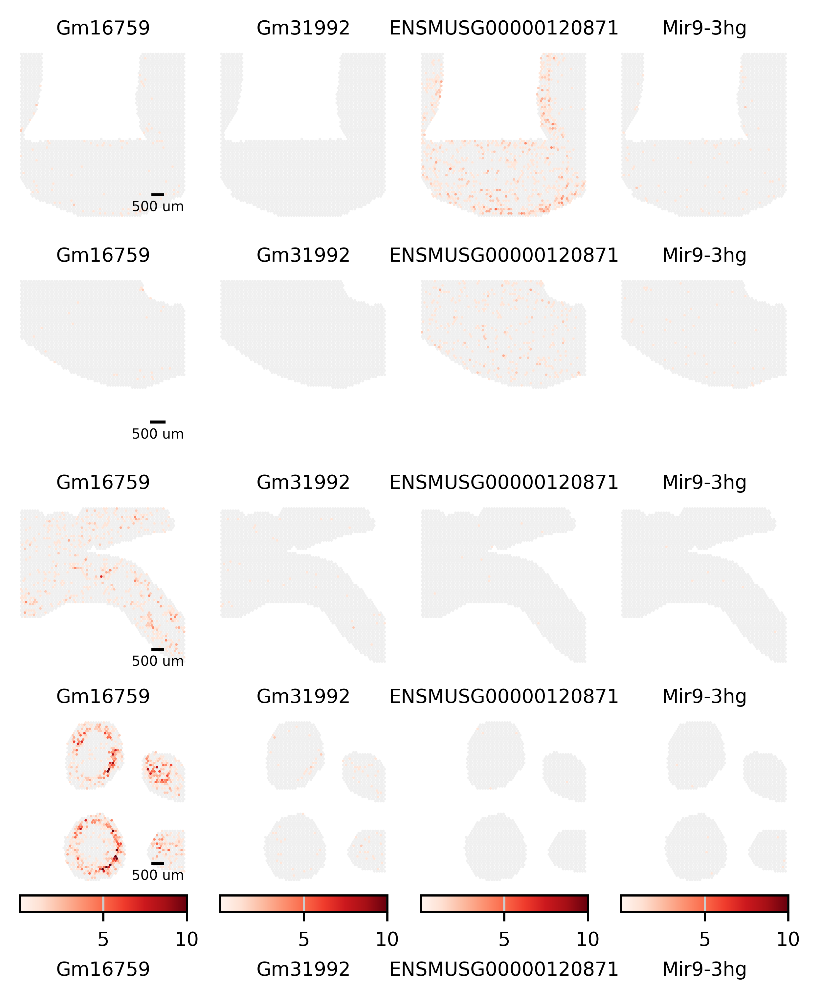

In [620]:

import scanpy as sc
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
import numpy as np

# Font properties for scale bar
fontprops = fm.FontProperties(size=5)

# Assuming 'mudata_dict' contains your MuData objects for different samples
samples_to_plot = [ 
    # 'Visium_A','Visium_B','Visium_C','Visium_D',
    'STRS_A','STRS_B','STRS_C','STRS_D']
modality_to_plot = 'family'
genes_to_plot = ['Richness_g','log1p_total_counts','log1p_total_counts_host',"Lactobacillaceae","Lachnospiraceae","Tannerellaceae","Eggerthellaceae"]
cmp = {}

# Define color limits for each gene
global_vmax = {"Gm16759": 10, "Gm31992": 10, "ENSMUSG00000120871": 10, "Mir9-3hg": 10}

# Define colormaps
cmp['Gm16759'] = newcmp7
cmp['Gm31992'] = newcmp7
cmp['ENSMUSG00000120871'] = newcmp7
cmp['Mir9-3hg'] = newcmp7

# Calculate global extents to ensure all plots have the same spatial limits
global_min_x, global_max_x, global_min_y, global_max_y = float('inf'), float('-inf'), float('inf'), float('-inf')
for sample in samples_to_plot:
    adata = mudata_dict[sample][modality_to_plot]
    coords = adata.obsm['spatial']
    global_min_x, global_max_x = min(global_min_x, coords[:, 0].min()), max(global_max_x, coords[:, 0].max())
    global_min_y, global_max_y = min(global_min_y, coords[:, 1].min()), max(global_max_y, coords[:, 1].max())

# Optional padding
padding = 50
global_min_x -= padding
global_max_x += padding
global_min_y -= padding
global_max_y += padding

# Setup figure and axes
fig, axs = plt.subplots(len(samples_to_plot), len(genes_to_plot), figsize=(5, 6), squeeze=False)

# Plot each gene for each sample with standardized spatial dimensions
for i, sample_key in enumerate(samples_to_plot):
    adata = mudata_dict[sample_key][modality_to_plot].copy()
    classification_B = adata.obsm['classification']['B']
    classification_C = adata.obsm['classification']['C']
    adata = adata[adata.obsm['classification']['C']]

    for j, gene in enumerate(genes_to_plot):
        ax = axs[i, j]
        sc.pl.spatial(adata, color=gene, ax=ax, show=False,
                      vmin=0.00001,
                      vmax=global_vmax[gene],
                      cmap=cmp[gene], spot_size=100, frameon=False, colorbar_loc=None,  # No automatic colorbar
                      title=None, na_color='black')  # Title only for top row
        
        # Set consistent axes limits
        ax.set_xlim(global_min_x, global_max_x)
        ax.set_ylim(global_min_y, global_max_y)
        ax.set_aspect('equal', adjustable='box')

        # Adding a scale bar to the first plot of each row
        if j == 0:
            scalebar = AnchoredSizeBar(ax.transData, 500, '500 um', 'lower right',
                                       pad=0.1, color='black', frameon=False, size_vertical=1,
                                       fontproperties=fontprops)
            ax.add_artist(scalebar)

        # Add colorbar to the bottom of the last plot in each column
        if i == len(samples_to_plot) - 1:
            divider = make_axes_locatable(ax)
            cax = divider.append_axes("bottom", size="10%", pad=0.05)  # Adjust 'size' to control thickness
            norm = cm.colors.Normalize(vmin=0.00001, 
                                       vmax=global_vmax[gene]
                                      )
            cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmp[gene]), cax=cax, orientation='horizontal')
            cbar.set_label(gene)

        # Remove any legend to clean up the plot
        if ax.get_legend() is not None:
            ax.get_legend().remove()

# Adjust subplot spacing and display the figure
plt.subplots_adjust(wspace=0.2, hspace=0.05)
plt.savefig('specific_non_coding__supplement.pdf', format='pdf', dpi=300)
plt.show()


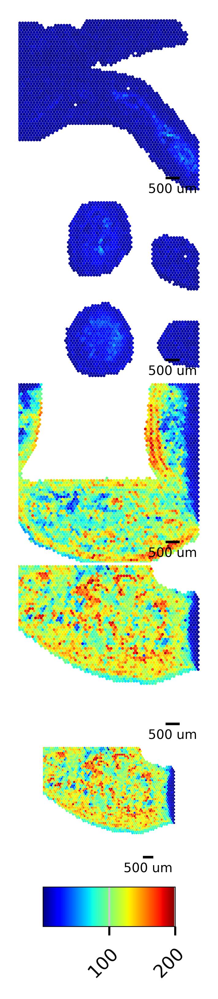

In [110]:
os.chdir("/fs/cbsuvlaminck2/workdir/in68/microSTRS/Figures/")
### Supplementary 3
import scanpy as sc
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
import numpy as np

# Font properties for scale bar
fontprops = fm.FontProperties(size=5)

# Assuming 'mudata_dict' contains your MuData objects for different samples
samples_to_plot = [
    # 'Visium_A', 'Visium_B','Visium_C', 'Visium_D',
    'STRS_A', 'STRS_B','STRS_C', 'STRS_D','STRS_D'
]
modality_to_plot = 'family'
genes_to_plot = ["Richness_g"
                 # ,"log1p_total_counts_host","log1p_total_counts","Lactobacillaceae", "Lachnospiraceae", "Tannerellaceae", "Eggerthellaceae"
                ]
cmp = {}
global_vmax = {}
# Define color limits for each gene
global_vmax['log1p_total_counts'] =10 
global_vmax['Richness_g'] = 200
global_vmax['log1p_total_counts_host'] = 10
global_vmax['Lactobacillaceae'] = 1000
global_vmax['Lachnospiraceae'] = 3000
global_vmax['Tannerellaceae'] = 30
global_vmax['Eggerthellaceae'] = 100

### Define colormaps
cmp['log1p_total_counts'] =newcmp5 
cmp['Richness_g'] = newcmp6
cmp['log1p_total_counts_host'] = newcmp5
cmp['Lactobacillaceae'] = newcmp6
cmp['Lachnospiraceae'] = newcmp6
cmp['Tannerellaceae'] = newcmp6
cmp['Eggerthellaceae'] = newcmp6

# Calculate global extents to ensure all plots have the same spatial limits
global_min_x, global_max_x, global_min_y, global_max_y = float('inf'), float('-inf'), float('inf'), float('-inf')
for sample in samples_to_plot:
    adata = mudata_dict[sample][modality_to_plot]
    coords = adata.obsm['spatial']
    global_min_x, global_max_x = min(global_min_x, coords[:, 0].min()), max(global_max_x, coords[:, 0].max())
    global_min_y, global_max_y = min(global_min_y, coords[:, 1].min()), max(global_max_y, coords[:, 1].max())

# Optional padding
padding = 0
global_min_x -= padding
global_max_x += padding
global_min_y -= padding
global_max_y += padding

# Setup figure and axes
fig, axs = plt.subplots(len(samples_to_plot), len(genes_to_plot), figsize=(5, 6.5), squeeze=False)

# Plot each gene for each sample with standardized spatial dimensions
for i, sample_key in enumerate(samples_to_plot):
    adata = mudata_dict[sample_key][modality_to_plot].copy()
    classification_B = adata.obsm['classification']['B']
    classification_C = adata.obsm['classification']['C']
    adata = adata[adata.obsm['classification']['C']]

    for j, gene in enumerate(genes_to_plot):
        ax = axs[i, j]
        sc.pl.spatial(adata, color=gene, ax=ax, show=False,
                      vmin=0.00001,
                      vmax=global_vmax[gene],
                      cmap=cmp[gene], spot_size=100, frameon=False, colorbar_loc=None,  # No automatic colorbar
                      title='', na_color='black')  # Title only for top row
        
        # Set consistent axes limits
        ax.set_xlim(global_min_x, global_max_x)
        ax.set_ylim(global_min_y, global_max_y)
        ax.set_aspect('equal', adjustable='box')

        # Adding a scale bar to the first plot of each row
        if j == 0:
            scalebar = AnchoredSizeBar(ax.transData, 500, '500 um', 'lower right',
                                       pad=0.1, color='black', frameon=False, size_vertical=1,
                                       fontproperties=fontprops)
            ax.add_artist(scalebar)

        # Add colorbar to the bottom of the last plot in each column
        if i == len(samples_to_plot) - 1:
            divider = make_axes_locatable(ax)
            cax = divider.append_axes("bottom", size="30%", pad=0.05)  # Adjust 'size' to control thickness
            norm = cm.colors.Normalize(vmin=0.00001, vmax=global_vmax[gene])
            cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmp[gene]), cax=cax, orientation='horizontal')
            # cbar.set_label(gene)
            plt.setp(cbar.ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

        # Remove any legend to clean up the plot
        if ax.get_legend() is not None:
            ax.get_legend().remove()

# Adjust subplot spacing and display the figure
plt.subplots_adjust(wspace=0.05, hspace=0.01)
plt.savefig('richness_again.pdf', format='pdf', dpi=300)
plt.show()


### Biotype feature plots

/home/in68/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
/home/in68/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
/home/in68/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
/home/in68/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
/home/in68/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
/home/in68/.local/lib/python3.9/site-pac

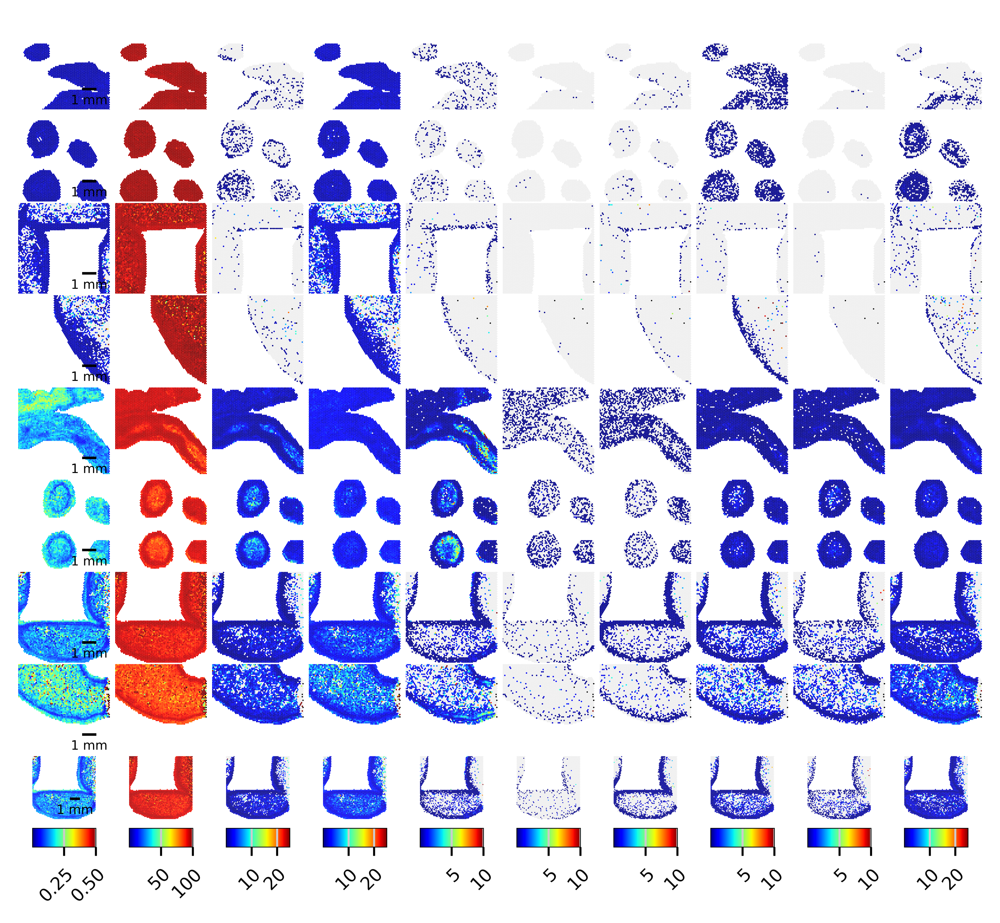

In [100]:
os.chdir("/fs/cbsuvlaminck2/workdir/in68/microSTRS/Figures/")
### Supplementary 3
import scanpy as sc
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
import numpy as np

# Font properties for scale bar
fontprops = fm.FontProperties(size=5)

# Assuming 'mudata_dict' contains your MuData objects for different samples
samples_to_plot = [
    'Visium_A', 'Visium_B','Visium_C', 'Visium_D',
    'STRS_A', 'STRS_B','STRS_C', 'STRS_D', 'STRS_C'
]
modality_to_plot = 'host'
genes_to_plot =['Unspliced.pct', 'pct.protein_coding', 'pct.rRNA', 'pct.lncRNA', 'pct.miRNA', 'pct.snRNA', 'pct.snoRNA', 'pct.Mt_tRNA', 'pct.misc_RNA', 'pct.Mt_rRNA']

cmp = {}
global_vmax = {}
# Define color limits for each gene
global_vmax['Unspliced.pct'] =0.5 
global_vmax['pct.protein_coding'] = 100
global_vmax['pct.rRNA'] = 25
global_vmax['pct.lncRNA'] = 25
global_vmax['pct.miRNA'] = 10
global_vmax['pct.snRNA'] = 10
global_vmax['pct.snoRNA'] = 10
global_vmax['pct.Mt_tRNA'] = 10
global_vmax['pct.misc_RNA'] = 10
global_vmax['pct.Mt_rRNA'] = 25

# ### Define colormaps
# cmp['log1p_total_counts'] =newcmp5 
# cmp['Richness_g'] = newcmp6
# cmp['log1p_total_counts_host'] = newcmp5
# cmp['Lactobacillaceae'] = newcmp6
# cmp['Lachnospiraceae'] = newcmp6
# cmp['Tannerellaceae'] = newcmp6
# cmp['Eggerthellaceae'] = newcmp6

# Calculate global extents to ensure all plots have the same spatial limits
global_min_x, global_max_x, global_min_y, global_max_y = float('inf'), float('-inf'), float('inf'), float('-inf')
for sample in samples_to_plot:
    adata = mudata_dict[sample][modality_to_plot]
    coords = adata.obsm['spatial']
    global_min_x, global_max_x = min(global_min_x, coords[:, 0].min()), max(global_max_x, coords[:, 0].max())
    global_min_y, global_max_y = min(global_min_y, coords[:, 1].min()), max(global_max_y, coords[:, 1].max())

# Optional padding
padding = 0
global_min_x -= padding
global_max_x += padding
global_min_y -= padding
global_max_y += padding

# Setup figure and axes
fig, axs = plt.subplots(len(samples_to_plot), len(genes_to_plot), figsize=(6.8, 6), squeeze=False)

# Plot each gene for each sample with standardized spatial dimensions
for i, sample_key in enumerate(samples_to_plot):
    adata = mudata_dict[sample_key][modality_to_plot].copy()
    classification_B = adata.obsm['classification']['B']
    classification_C = adata.obsm['classification']['C']
    adata = adata[adata.obsm['classification']['C']]

    for j, gene in enumerate(genes_to_plot):
        ax = axs[i, j]
        sc.pl.spatial(adata, color=gene, ax=ax, show=False,
                      vmin=0.00001,
                      vmax=global_vmax[gene],
                      cmap=newcmp6, spot_size=100, frameon=False, colorbar_loc=None,  # No automatic colorbar
                      title='', na_color='black')  # Title only for top row
        
        # Set consistent axes limits
        ax.set_xlim(global_min_x, global_max_x)
        ax.set_ylim(global_min_y, global_max_y)
        ax.set_aspect('equal', adjustable='box')

        # Adding a scale bar to the first plot of each row
        if j == 0:
            scalebar = AnchoredSizeBar(ax.transData, 1000, '1 mm', 'lower right',
                                       pad=0.1, color='black', frameon=False, size_vertical=1,
                                       fontproperties=fontprops)
            ax.add_artist(scalebar)

        # Add colorbar to the bottom of the last plot in each column
        if i == len(samples_to_plot) - 1:
            divider = make_axes_locatable(ax)
            cax = divider.append_axes("bottom", size="30%", pad=0.05)  # Adjust 'size' to control thickness
            norm = cm.colors.Normalize(vmin=0.0000001, vmax=global_vmax[gene])
            cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=newcmp6), cax=cax, orientation='horizontal')
            # cbar.set_label(gene)
            plt.setp(cbar.ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

        # Remove any legend to clean up the plot
        if ax.get_legend() is not None:
            ax.get_legend().remove()

# Adjust subplot spacing and display the figure
plt.subplots_adjust(wspace=0.05, hspace=0.01)
plt.savefig('biotypes__supplement.pdf', format='pdf', dpi=300)
plt.show()


### microbial et al feature plots

In [102]:
for sample in samples_to_plot:
    ## Add a filter to exclude lowly occuring taxa before calculating Richness
    adata = mudata_dict[sample]['genus'].copy()
    adata.X = adata.raw.X
    adata = adata[adata.obsm['classification']['C']]
    taxa_counts = adata.X.sum(axis=0) / adata.obs['Total_counts'].sum()
    mask = taxa_counts > 0.0001
    adata = adata[:,mask]
    spots = adata.X > 0 
    adata.obs['Richness']=spots.sum(axis=1)
    mudata_dict[sample]['family'].obs['Richness_g'] = adata.obs['Richness']
    mudata_dict[sample]['family'].obs['log1p_total_counts']= np.log1p(mudata_dict[sample]['family'].obs['Total_counts'])
    mudata_dict[sample]['family'].obs['log1p_total_counts_host'] = np.log1p(mudata_dict[sample]['host'].obs['Total_counts'])
    


/tmp/ipykernel_728515/2513494082.py:10: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['Richness']=spots.sum(axis=1)
/tmp/ipykernel_728515/2513494082.py:10: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['Richness']=spots.sum(axis=1)
/tmp/ipykernel_728515/2513494082.py:10: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['Richness']=spots.sum(axis=1)
/tmp/ipykernel_728515/2513494082.py:10: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['Richness']=spots.sum(axis=1)
/tmp/ipykernel_728515/2513494082.py:10: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['Richness']=spots.sum(axis=1)
/tmp/ipykernel_728515/2513494082.py:10: ImplicitModificationWarning: Trying to modify

In [111]:
mudata_dict['STRS_B']['family'].obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 4986 × 343
    obs: 'Total_counts_unfiltered', 'Total_counts', 'Total_counts_unclassified', 'Total_counts_classified', 'unique_taxa_per_spot', 'Richness_g', 'log1p_total_counts', 'log1p_total_counts_host'
    uns: 'log1p'
    obsm: 'spatial', 'classification'>

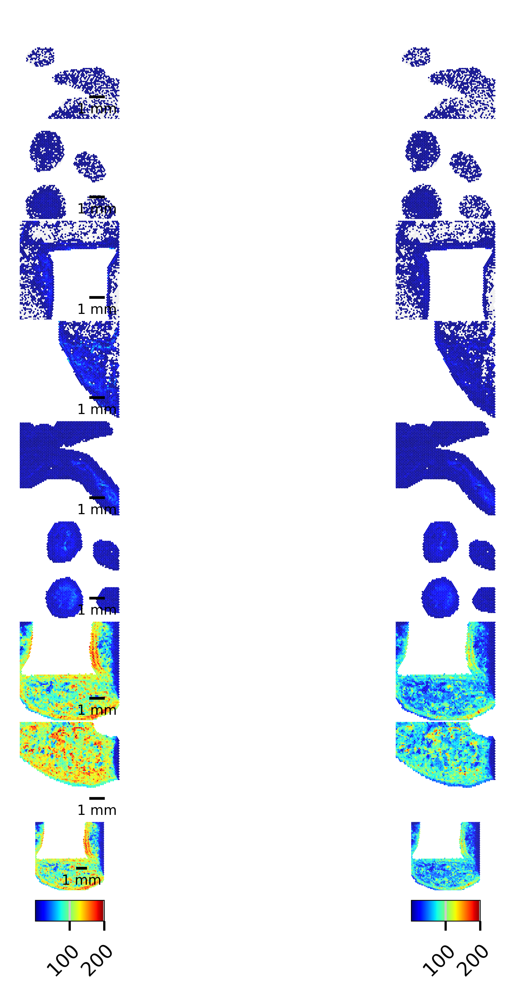

In [113]:
os.chdir("/fs/cbsuvlaminck2/workdir/in68/microSTRS/Figures/")
### Supplementary 3
import scanpy as sc
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
import numpy as np

# Font properties for scale bar
fontprops = fm.FontProperties(size=5)

# Assuming 'mudata_dict' contains your MuData objects for different samples
samples_to_plot = [
    'Visium_A', 'Visium_B','Visium_C', 'Visium_D',
    'STRS_A', 'STRS_B','STRS_C', 'STRS_D', 'STRS_C'
]
modality_to_plot = 'family'
genes_to_plot = ["Richness_g",'unique_taxa_per_spot'
                 # ,"log1p_total_counts_host","log1p_total_counts","Lactobacillaceae", "Lachnospiraceae", "Tannerellaceae", "Eggerthellaceae"
                ]
cmp = {}
global_vmax = {}
# Define color limits for each gene
global_vmax['unique_taxa_per_spot'] =200 
global_vmax['Richness_g'] = 200
global_vmax['log1p_total_counts_host'] = 10
global_vmax['Lactobacillaceae'] = 1000
global_vmax['Lachnospiraceae'] = 3000
global_vmax['Tannerellaceae'] = 30
global_vmax['Eggerthellaceae'] = 100

### Define colormaps
cmp['log1p_total_counts'] =newcmp5 
cmp['Richness_g'] = newcmp6
cmp['log1p_total_counts_host'] = newcmp5
cmp['unique_taxa_per_spot'] = newcmp6
cmp['Lachnospiraceae'] = newcmp6
cmp['Tannerellaceae'] = newcmp6
cmp['Eggerthellaceae'] = newcmp6

# Calculate global extents to ensure all plots have the same spatial limits
global_min_x, global_max_x, global_min_y, global_max_y = float('inf'), float('-inf'), float('inf'), float('-inf')
for sample in samples_to_plot:
    adata = mudata_dict[sample][modality_to_plot]
    coords = adata.obsm['spatial']
    global_min_x, global_max_x = min(global_min_x, coords[:, 0].min()), max(global_max_x, coords[:, 0].max())
    global_min_y, global_max_y = min(global_min_y, coords[:, 1].min()), max(global_max_y, coords[:, 1].max())

# Optional padding
padding = 0
global_min_x -= padding
global_max_x += padding
global_min_y -= padding
global_max_y += padding

# Setup figure and axes
fig, axs = plt.subplots(len(samples_to_plot), len(genes_to_plot), figsize=(4.76, 6), squeeze=False)

# Plot each gene for each sample with standardized spatial dimensions
for i, sample_key in enumerate(samples_to_plot):
    adata = mudata_dict[sample_key][modality_to_plot].copy()
    classification_B = adata.obsm['classification']['B']
    classification_C = adata.obsm['classification']['C']
    adata = adata[adata.obsm['classification']['C']]

    for j, gene in enumerate(genes_to_plot):
        ax = axs[i, j]
        sc.pl.spatial(adata, color=gene, ax=ax, show=False,
                      vmin=0.00001,
                      vmax=global_vmax[gene],
                      cmap=cmp[gene], spot_size=100, frameon=False, colorbar_loc=None,  # No automatic colorbar
                      title='', na_color='black')  # Title only for top row
        
        # Set consistent axes limits
        ax.set_xlim(global_min_x, global_max_x)
        ax.set_ylim(global_min_y, global_max_y)
        ax.set_aspect('equal', adjustable='box')

        # Adding a scale bar to the first plot of each row
        if j == 0:
            scalebar = AnchoredSizeBar(ax.transData, 1000, '1 mm', 'lower right',
                                       pad=0.1, color='black', frameon=False, size_vertical=1,
                                       fontproperties=fontprops)
            ax.add_artist(scalebar)

        # Add colorbar to the bottom of the last plot in each column
        if i == len(samples_to_plot) - 1:
            divider = make_axes_locatable(ax)
            cax = divider.append_axes("bottom", size="30%", pad=0.05)  # Adjust 'size' to control thickness
            norm = cm.colors.Normalize(vmin=0.00001, vmax=global_vmax[gene])
            cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmp[gene]), cax=cax, orientation='horizontal')
            # cbar.set_label(gene)
            plt.setp(cbar.ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

        # Remove any legend to clean up the plot
        if ax.get_legend() is not None:
            ax.get_legend().remove()

# Adjust subplot spacing and display the figure
plt.subplots_adjust(wspace=0.05, hspace=0.01)
plt.savefig('spatial_bacteria_feature.pdf', format='pdf', dpi=300)
plt.show()


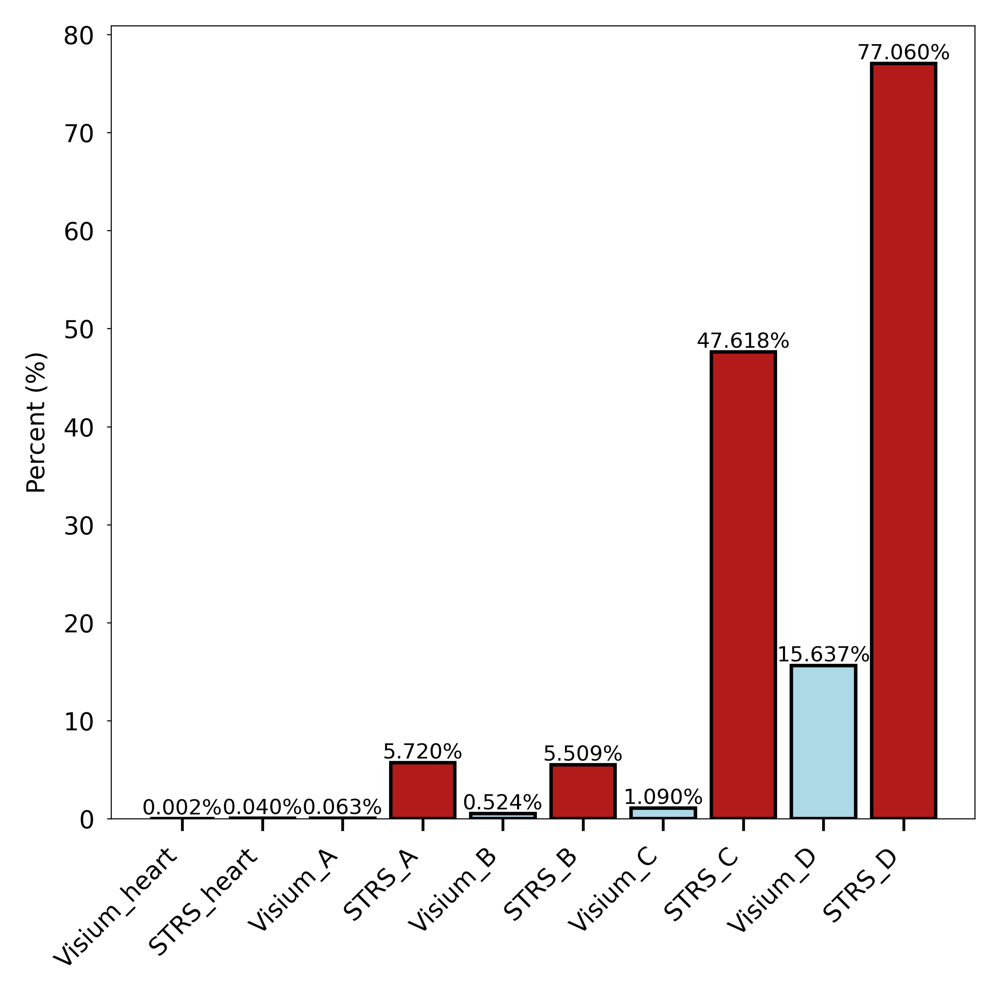

In [69]:
# Plot Microbial reads vs Total Reads pct 
data = {
    'Sample': ['Visium_heart', 'STRS_heart', 'Visium_A', 'STRS_A', 
               'Visium_B', 'STRS_B', 'Visium_C', 'STRS_C', 
               'Visium_D', 'STRS_D'],
    'Percent': [0.002, 0.040, 0.063, 5.720, 
                0.524, 5.509, 1.090, 47.618, 
                15.637, 77.060]
}

# Create DataFrame
df = pd.DataFrame(data)

# Create the bar plot
plt.figure(figsize=(4, 4))
bars = plt.bar(df['Sample'], df['Percent'], color=['#ADD8E6', '#B31B1B'] * 5, edgecolor='black')

# Add the percentages on top of each bar
for bar, percent in zip(bars, df['Percent']):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{percent:.3f}%', 
             ha='center', va='bottom', fontsize=6)

# Customize the plot
plt.xticks(rotation=45, ha='right')
plt.ylabel('Percent (%)')
plt.grid(False)
plt.tight_layout()
plt.savefig('/fs/cbsuvlaminck2/workdir/in68/microSTRS/Figures/control_pct.pdf', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()